In [1]:
import pandas as pd
import numpy as np
import missingno as msno
from matplotlib import pyplot as plt
from matplotlib import patches as mpatches
import sys
sys.path.insert(1, '../Scripts')
from funciones import simbologia, MissingMechanism

# Load data

As the database compiles information from existing bibliography, some of the numerical features, in particular geochemical composition have non numerical values. For example, when the amount of an element contained in a sample is below than the detection limit of the measuring technique the values is "bdl", other possible values are "not determined", "not analyzed", "<1", etc. To analyze the data set these values are replaced by 'nan'.


### Labeled data

Labeled data corresponds to the information where samples are interpreted to derived from an especific volcano and/or a especific eruption from that volcano. The samples that have been measured for geochemistry and/or radiocarbon but still is unclear which volcano or eruption they come from, are labeled "Unknown".

In [2]:
Data = pd.read_excel("../TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data = Data.drop(['SampleID','SamplePoint','2SE','87Sr/86Sr','TipoDeSección','Latitud','Longitud','CódigoLaboratorioRadiocarbono','Comentarios','Mapa?','Flag','DescripciónFlag','ErrorEdad'], axis=1)
Data = Data[Data.Volcán != 'Unknown']

#### check missing data

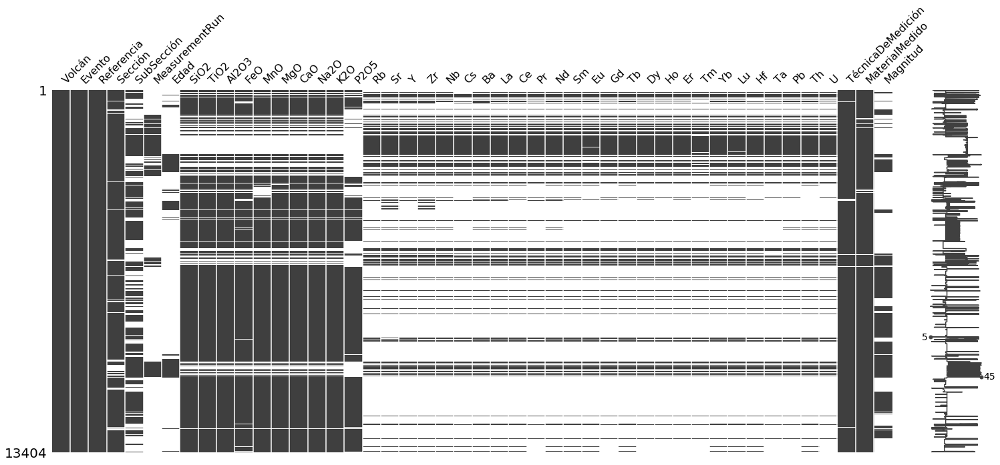

In [23]:
msno.matrix(Data)

### Unlabeled data

In [ ]:
Data = pd.read_excel("C:/Users/consu/OneDrive/PhD/TephraDataBase/TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data = Data.drop(['2SE','87Sr/86Sr','CódigoLaboratorioRadiocarbono','ErrorEdad'], axis=1)
Data = Data[Data.Volcán == 'Unknown']

#### check missing data

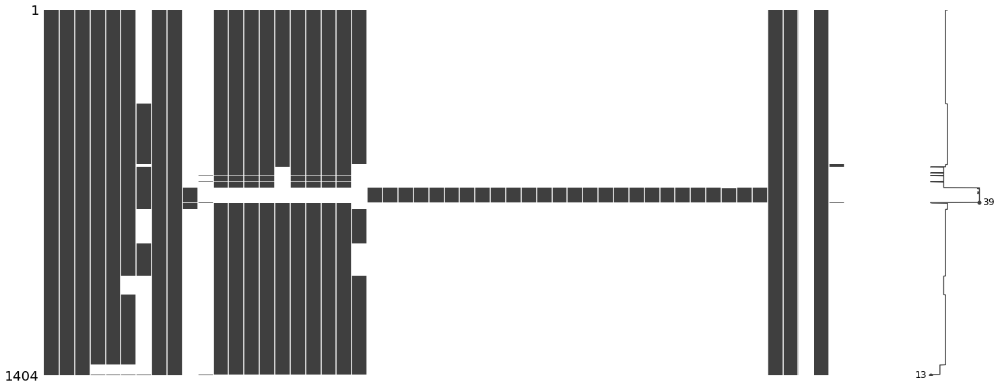

In [11]:
msno.matrix(Data)

## Check Label balance

#### Volcanoes

In [19]:
Data = pd.read_excel("../TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data = Data.drop(['2SE','87Sr/86Sr','CódigoLaboratorioRadiocarbono','ErrorEdad'], axis=1)
print("Numer of volcanoes included in the database: {} ".format(Data.Volcán.unique().shape[0]))
print("Numer of labeled samples included in the database: {} ".format(Data[Data.Volcán != 'Unknown'].shape[0]))
print("Numer of labeled samples included in the database: {} ".format(Data[Data.Volcán == 'Unknown'].shape[0]))
print(Data.Volcán.value_counts())

Numer of volcanoes included in the database: 30 
Numer of labeled samples included in the database: 13404 
Numer of labeled samples included in the database: 1404 
Mocho-Choshuenco           2652
Chaitén                    2457
Puyehue-Cordón Caulle      1859
Llaima                     1479
Unknown                    1404
Quetrupillán               1189
Villarrica                  888
Hudson                      605
Melimoyu                    460
Michinmahuida               413
Huanquihue Group            176
Carrán-Los Venados          162
Calbuco                     154
Burney                      141
Caburga-Huelemolle          134
Antillanca - Casablanca     106
Lanín                       100
Sollipulli                   75
Mentolat                     74
Osorno                       57
Reclus                       50
Apagado                      44
Puyehue                      43
Yate                         30
Subsidiary Vcha dome         21
Hornopirén                   16
Hueq

#### Eruptive Events

In [31]:
print("Number of eruptive events (tephras) included in the database: {} ".format(Data.Evento.unique().shape[0]))
print(Data[Data.Volcán != 'Unknown'].Evento.value_counts())

Number of eruptive events (tephras) included in the database: 118 
Unknown              3132
PCC2011               701
Cha1                  685
Vcha-2008             655
Neltume               527
Puesco                493
Mil Hojas             413
Enco                  394
La Junta              365
Lepué                 361
Pucón                 290
Arauco                289
Pirehueico            246
Llaima Pumice         245
Ranco                 242
Huilo                 214
MC12                  188
1852 Llaima           186
Hua-hum               181
Grande                152
Vilcún                147
Riñihue               131
Achen                 128
Pumalín               122
PCC2                  115
Quet1                 114
HW3                   110
H1                    108
HW6                   103
Quet5                  98
                     ... 
Villarrica 1971         8
Calbuco2015             7
MEN1                    6
Ho1                     6
MC21                   

### Label balance by volcano and event

In [35]:
print('Volcanes diferentes:  {}'.format(Data['Volcán'].unique().size))
print('Eventos diferentes: {}'.format(Data['Evento'].unique().size))
print(" ")
print("Número de Eventos diferentes por volcán")
print(" ")
print(" ")
for i in Data['Volcán'].unique():
    print('\033[1m'+ 'Volcán '+ i+ '\033[0m')
    print(Data['Evento'][Data['Volcán']==i].value_counts())
    print(" ")

Volcanes diferentes:  30
Eventos diferentes: 118
 
Número de Eventos diferentes por volcán
 
 
Volcán Antillanca - Casablanca
NahuelHuapi            70
Rayhuen                19
Playas Blanca-Negra    10
Unknown                 7
Name: Evento, dtype: int64
 
Volcán Apagado
Ap1    44
Name: Evento, dtype: int64
 
Volcán Burney
MB2        56
MB1        46
Unknown    24
MB1910     15
Name: Evento, dtype: int64
 
Volcán Caburga-Huelemolle
Unknown    134
Name: Evento, dtype: int64
 
Volcán Calbuco
Unknown              133
Calbuco2015            7
Alerce Ignimbrite      5
Ca1                    3
Ca7                    2
Calbuco1929            1
Ca13                   1
Calbuco1971?           1
Calbuco1961            1
Name: Evento, dtype: int64
 
Volcán Carrán-Los Venados
Unknown          71
Carrán1955       48
Riñinahue1907    43
Name: Evento, dtype: int64
 
Volcán Cay
Unknown    2
Name: Evento, dtype: int64
 
Volcán Chaitén
Cha1          685
Vcha-2008     655
Unknown       633
Grande      

### Distribution data, color by volcano
Here we can observe not only the distribution of the data in the data base by feature, but also observe the inbalance of the available information by volcano. This is especially visible in trace elements, wheree volcán Chaitén has 10 times the data of other volcanoes.

 
Edad
Volcán without information Apagado
Volcán without information Caburga-Huelemolle
Volcán without information Cay
Volcán without information Hornopirén
Volcán without information Huanquihue Group
Volcán without information Huequi
Volcán without information Subsidiary Vcha dome


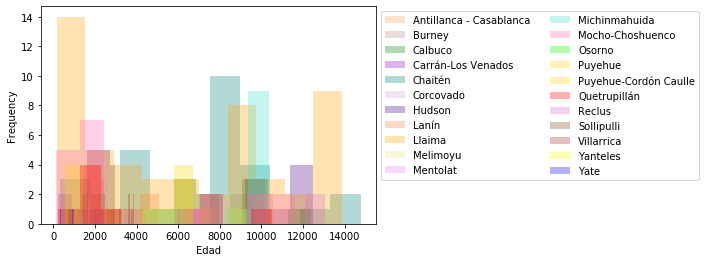

 
SiO2


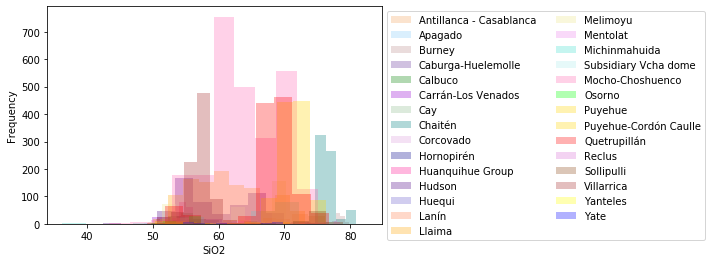

 
TiO2


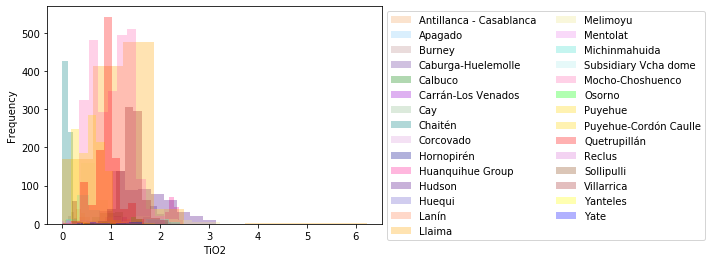

 
Al2O3


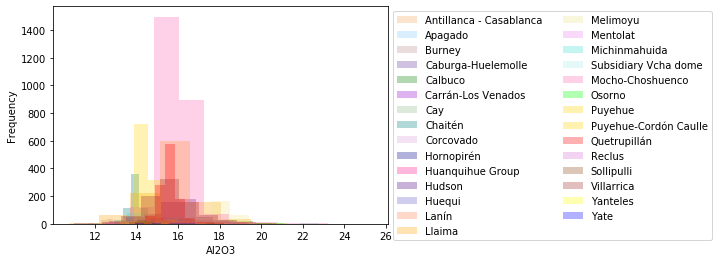

 
FeO


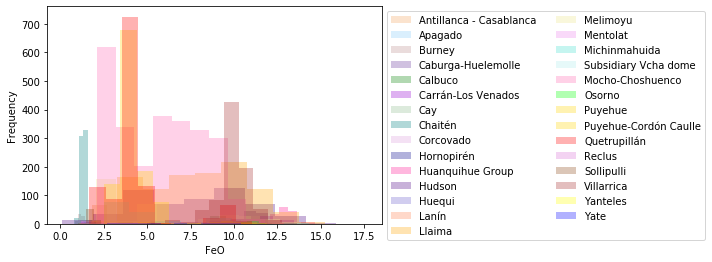

 
MnO


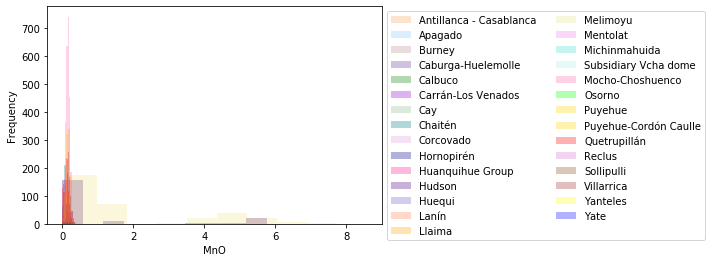

 
MgO


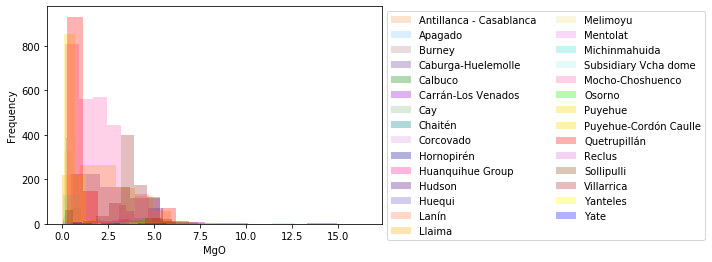

 
CaO


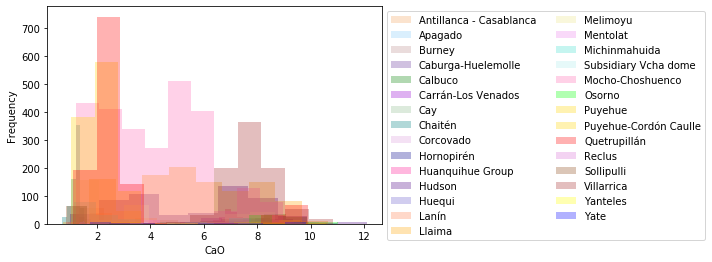

 
Na2O


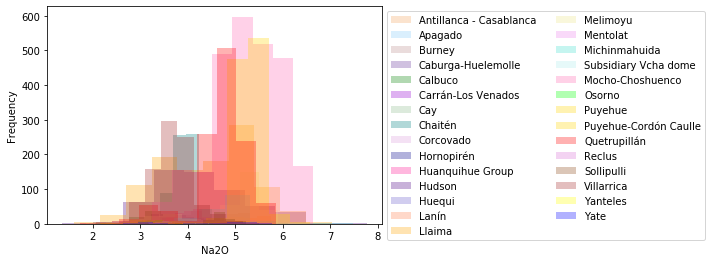

 
K2O


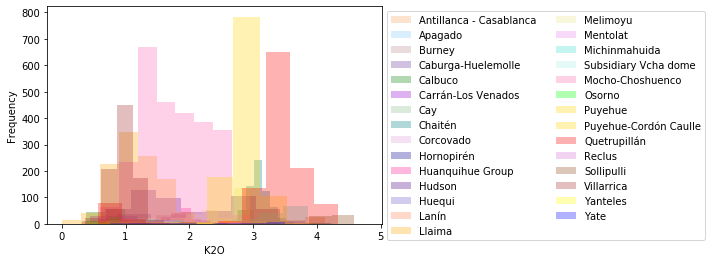

 
P2O5
Volcán without information Apagado
Volcán without information Subsidiary Vcha dome


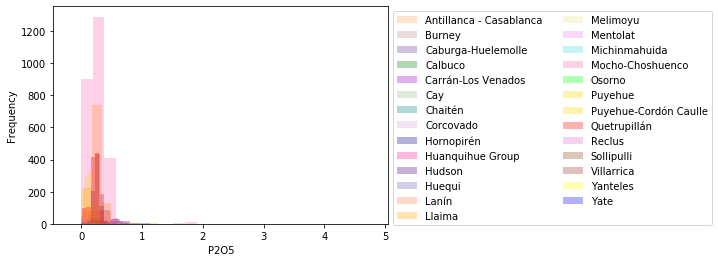

 
Rb
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


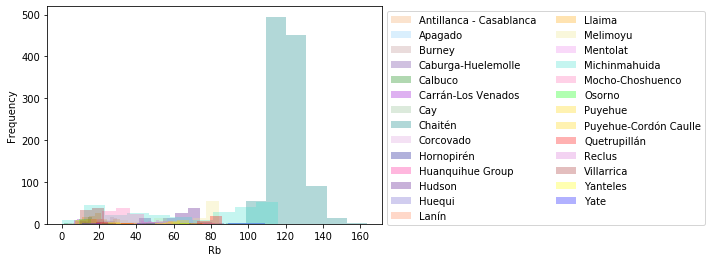

 
Sr
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


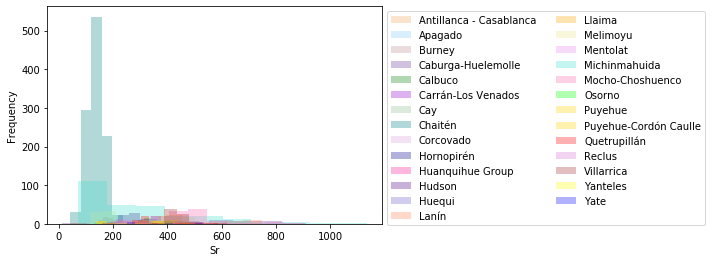

 
Y
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


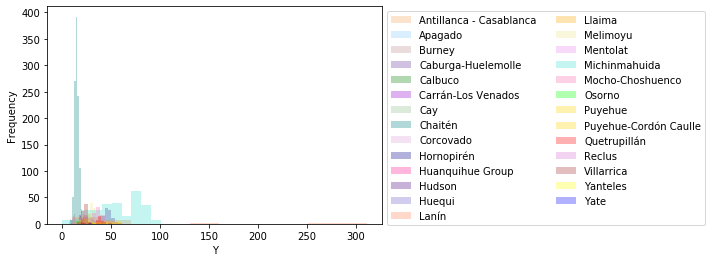

 
Zr
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


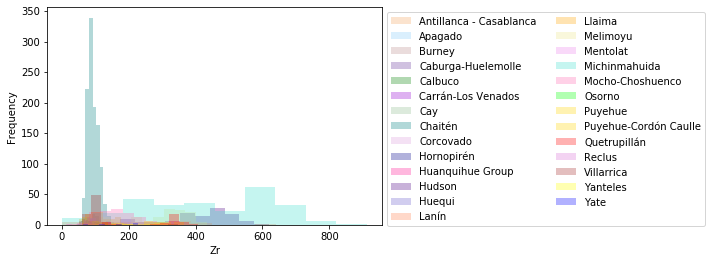

 
Nb
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


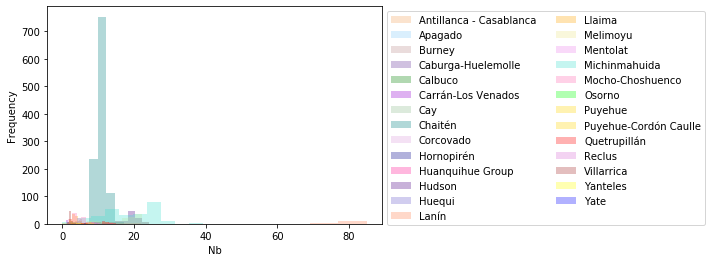

 
Cs
Volcán without information Corcovado
Volcán without information Hornopirén
Volcán without information Huequi
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


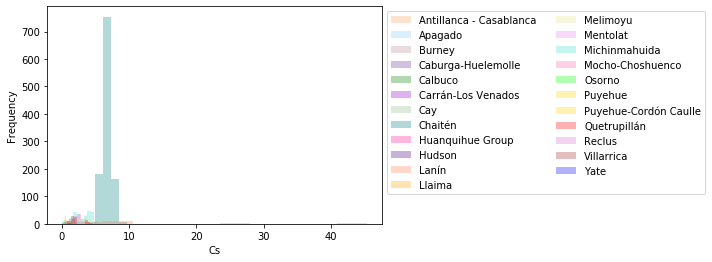

 
Ba
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


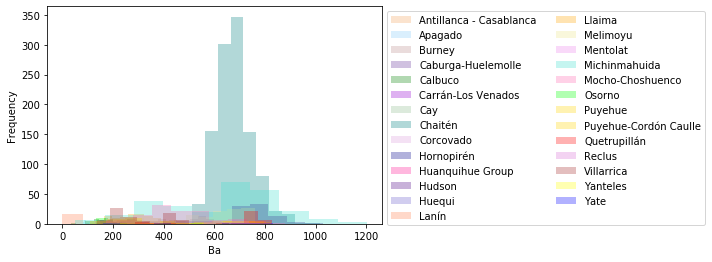

 
La
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


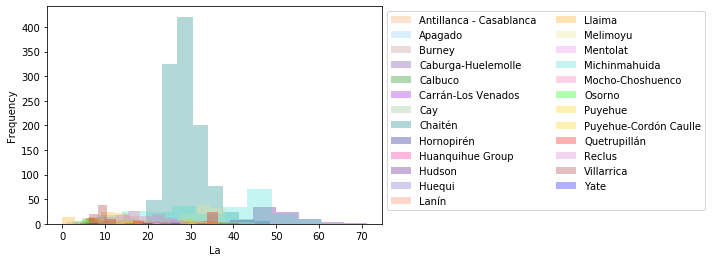

 
Ce
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


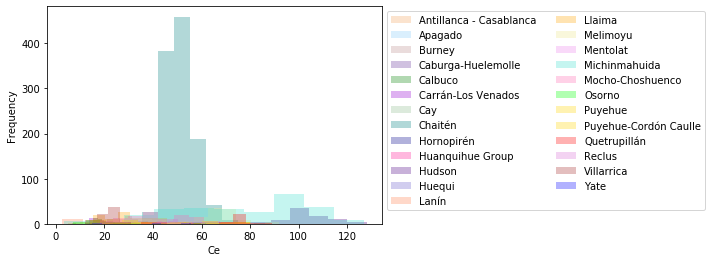

 
Pr
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


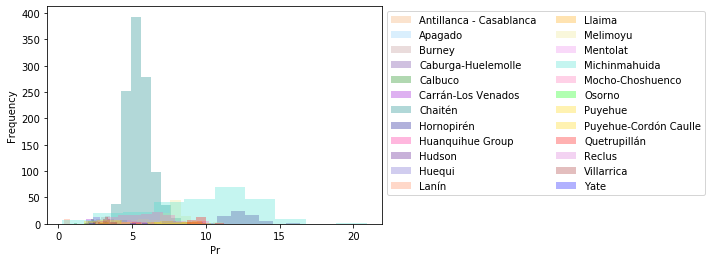

 
Nd
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


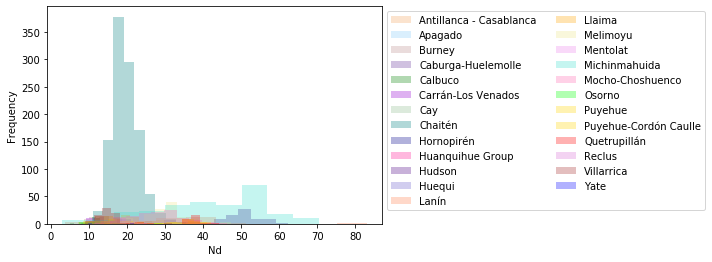

 
Sm
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


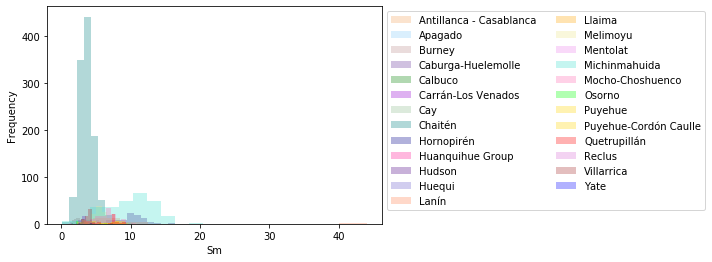

 
Eu
Volcán without information Corcovado
Volcán without information Huequi
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


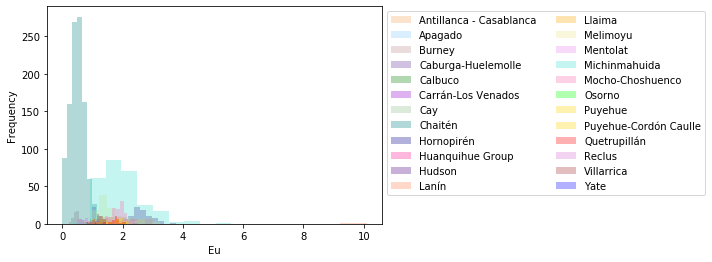

 
Gd
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


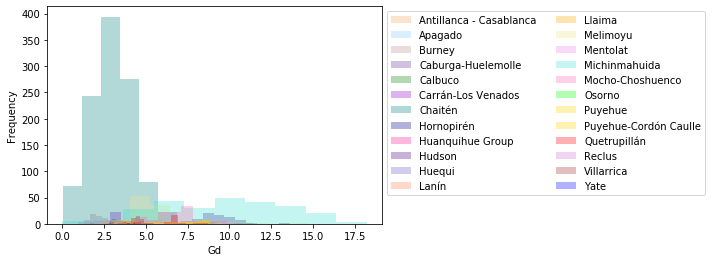

 
Tb
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


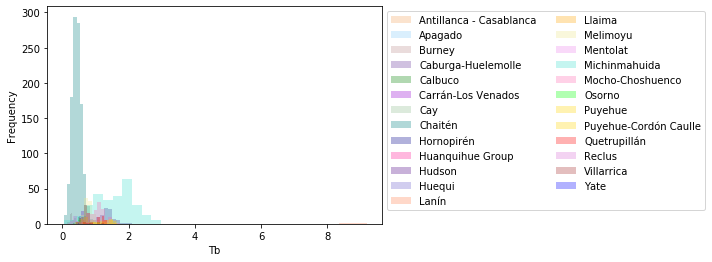

 
Dy
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


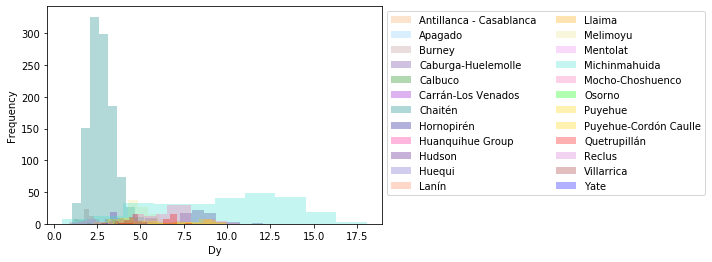

 
Ho
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


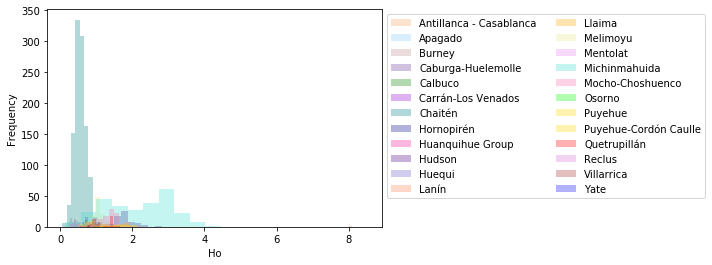

 
Er
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


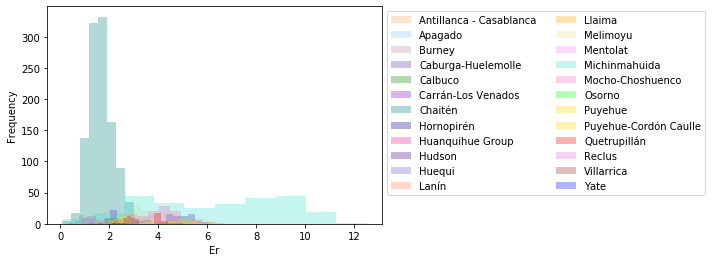

 
Tm
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Lanín
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


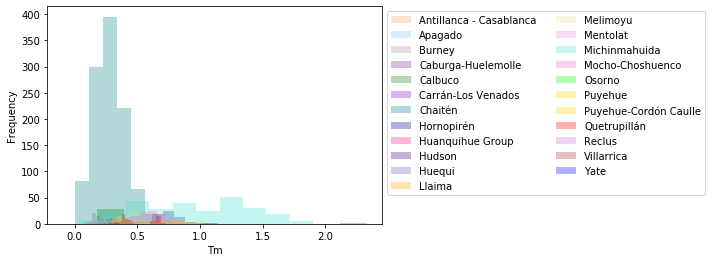

 
Yb
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


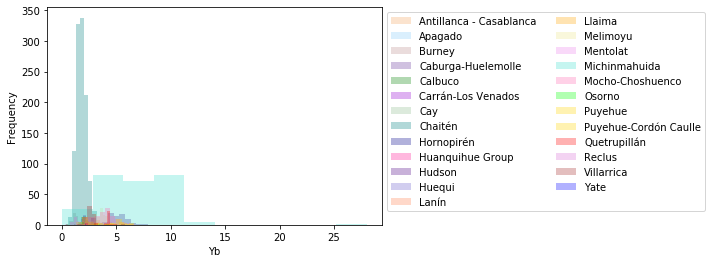

 
Lu
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


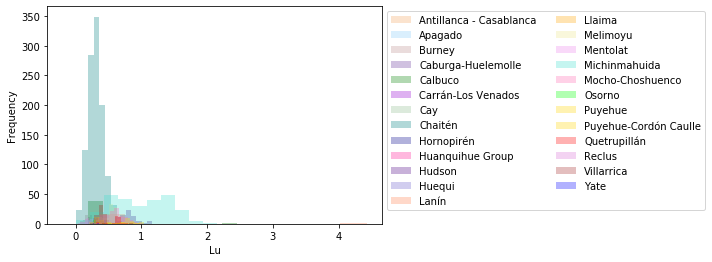

 
Hf
Volcán without information Corcovado
Volcán without information Huequi
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


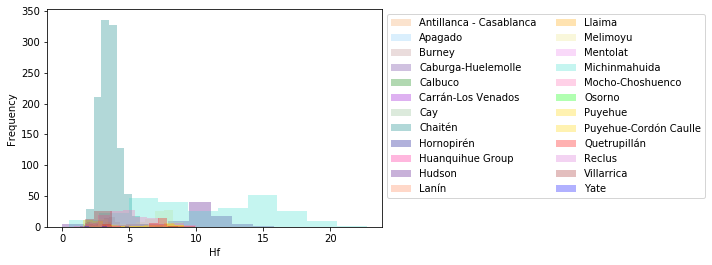

 
Ta
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Lanín
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


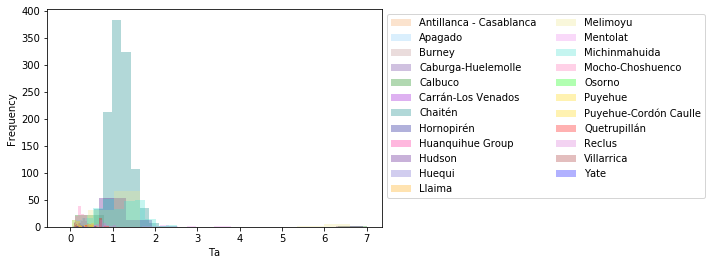

 
Pb
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Lanín
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


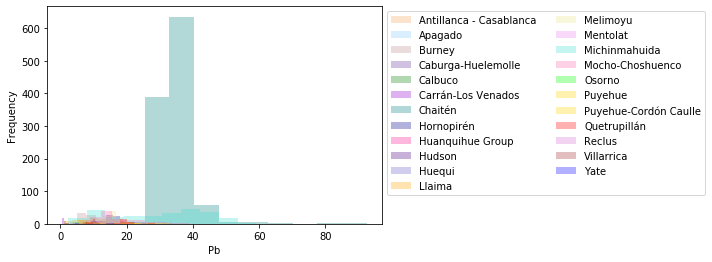

 
Th
Volcán without information Corcovado
Volcán without information Huequi
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


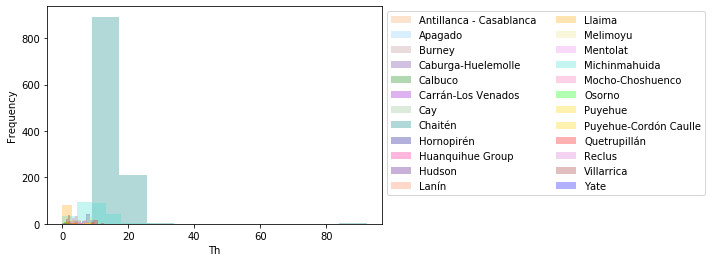

 
U
Volcán without information Corcovado
Volcán without information Lanín
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


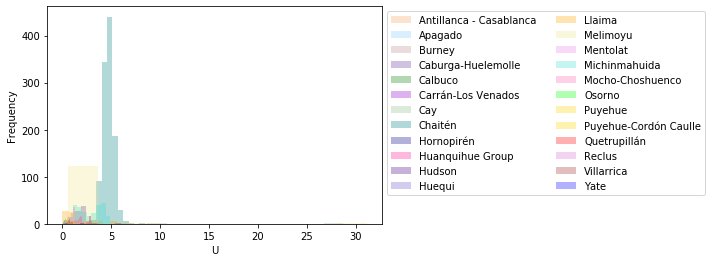

 
Magnitud
Volcán without information Burney
Volcán without information Caburga-Huelemolle
Volcán without information Calbuco
Volcán without information Carrán-Los Venados
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Hornopirén
Volcán without information Huanquihue Group
Volcán without information Huequi
Volcán without information Lanín
Volcán without information Melimoyu
Volcán without information Subsidiary Vcha dome
Volcán without information Osorno
Volcán without information Puyehue
Volcán without information Reclus
Volcán without information Yanteles
Volcán without information Yate


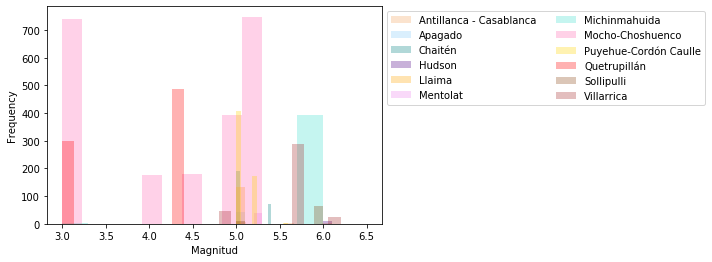

In [13]:
#drop non numerical features
Data = pd.read_excel("../Data/TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data_temp = Data.drop(['SampleID','SamplePoint','Sección','SubSección','MeasurementRun','87Sr/86Sr','2SE','CódigoLaboratorioRadiocarbono','TipoDeSección','Comentarios','Mapa?','Flag','DescripciónFlag','Latitud','Longitud','MaterialMedido','TécnicaDeMedición','Referencia','ErrorEdad'], axis=1)
Data_temp = Data_temp[Data_temp.Volcán != 'Unknown']

#create a new column which indicates if  
Data_temp['Historic'] = Data_temp['Edad'].str.contains('Historic')
Data_temp = Data_temp[Data_temp['Historic']!= True]
Data_temp = Data_temp.drop(['Historic'], axis=1)

volcanes = Data_temp['Volcán'].unique()

for elemento in Data_temp.columns:

    if (elemento != 'Volcán')&(elemento != 'Evento'):  
        print(" ")
        print('\033[1m'+ elemento + '\033[0m')
        for i in volcanes:
            coloR, Marker  = simbologia(i,'Unknown')
            Data_volcan =Data_temp[Data_temp['Volcán']==i]
            if pd.isnull(Data_volcan[elemento]).all():
                print('Volcán without information {}'.format(i))              
            else:
                plt.hist(Data_volcan[elemento] ,label= i, color = coloR, alpha= 0.3,range=(np.nanmin(Data_volcan[elemento]), np.nanmax(Data_volcan[elemento])))  
    
        plt.gca().set(xlabel=elemento,ylabel='Frequency')
        plt.legend(bbox_to_anchor=(1,1),ncol=2)
        plt.show()
           

### Distribution data, separated by volcano

C:\Users\consu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:780: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\consu\Anaconda3\lib\site-packages\numpy\lib\function_base.py:781: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


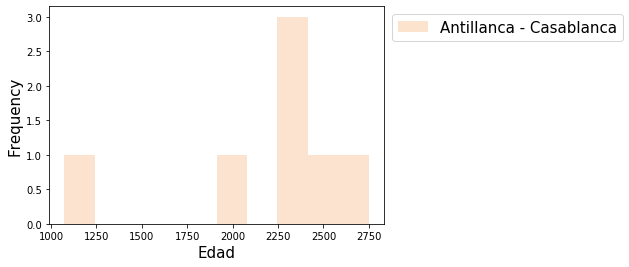

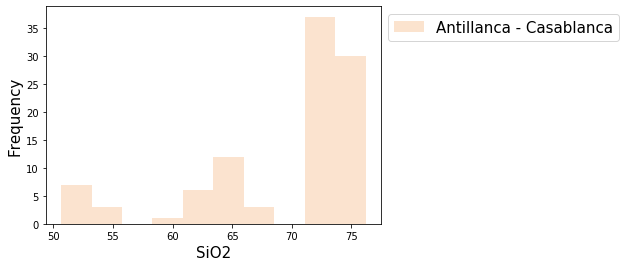

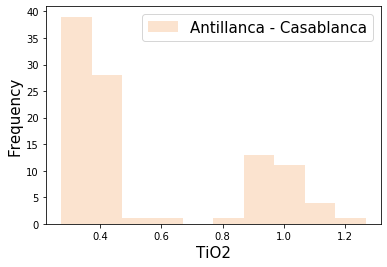

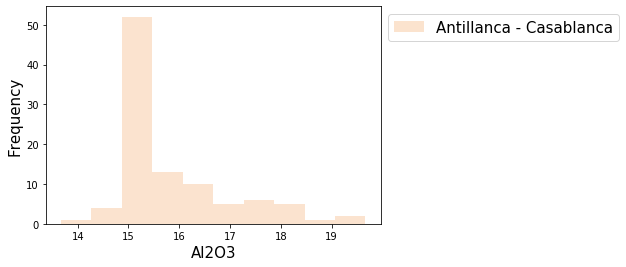

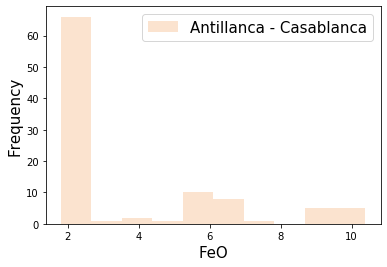

...

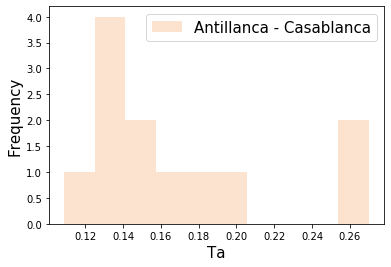

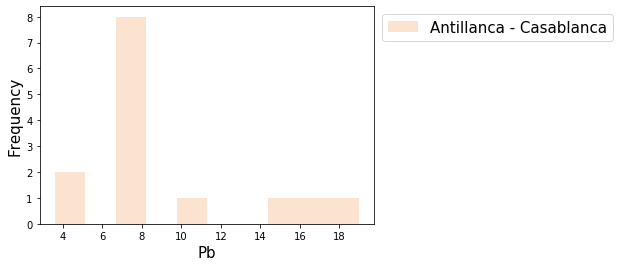

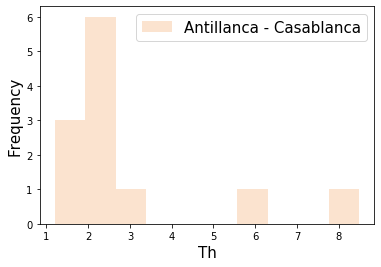

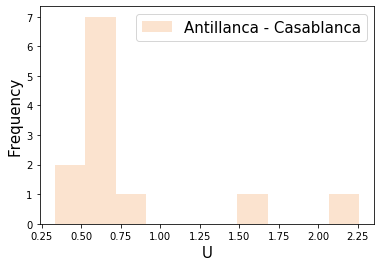

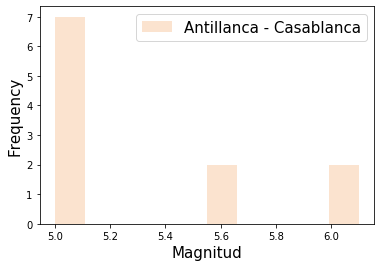

Volcán Yate without information for Edad


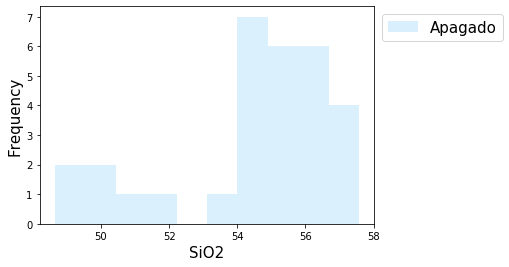

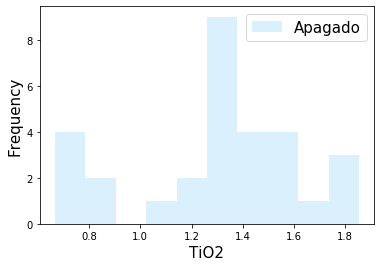

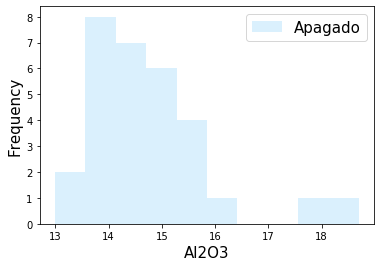

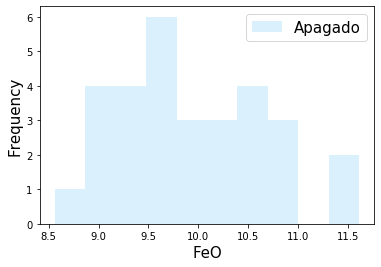

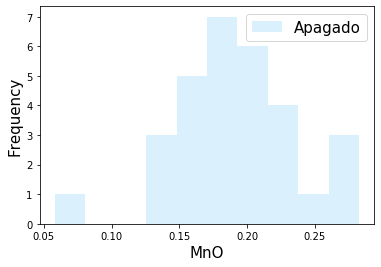

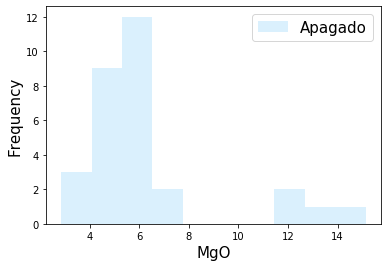

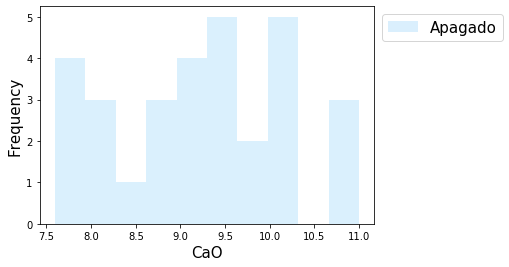

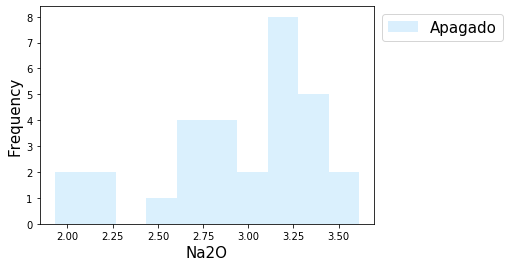

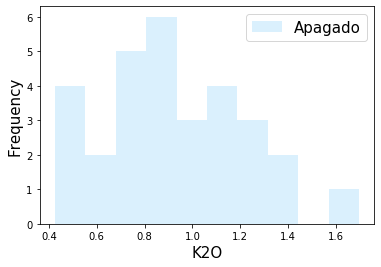

Volcán Yate without information for P2O5


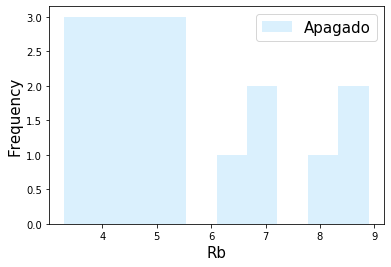

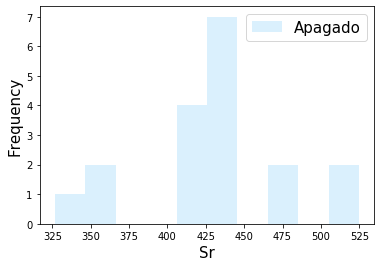

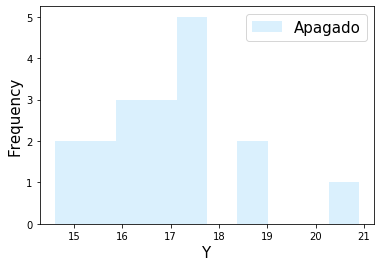

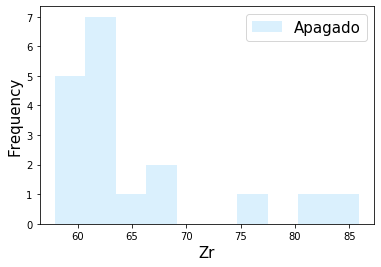

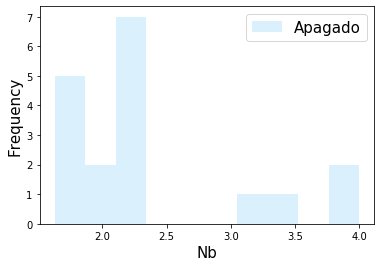

...

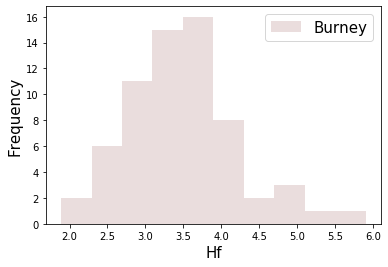

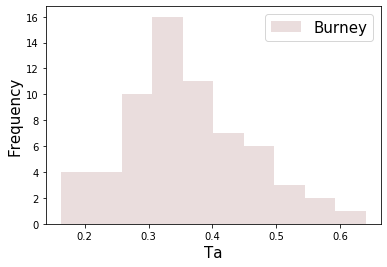

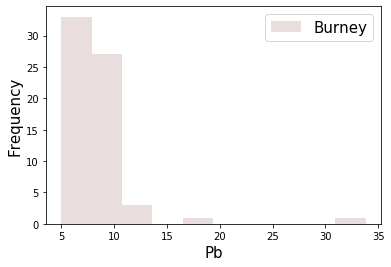

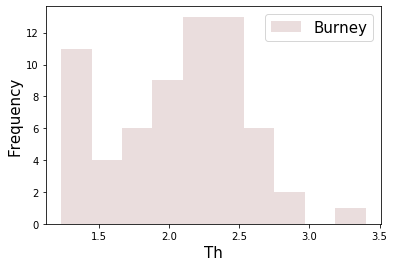

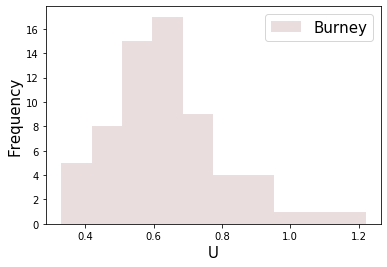

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


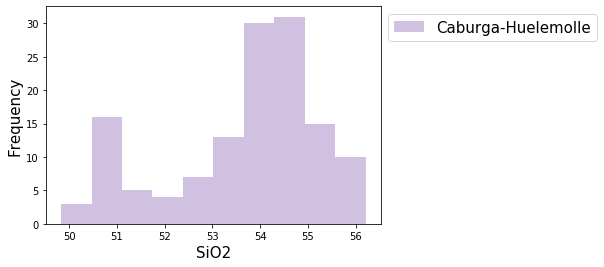

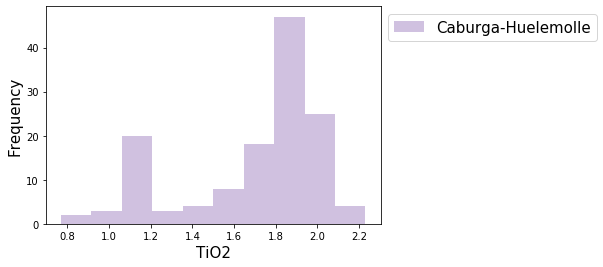

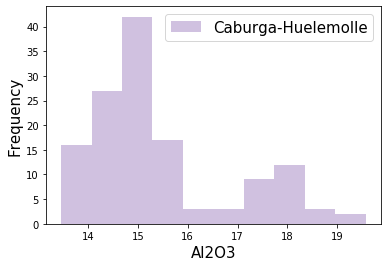

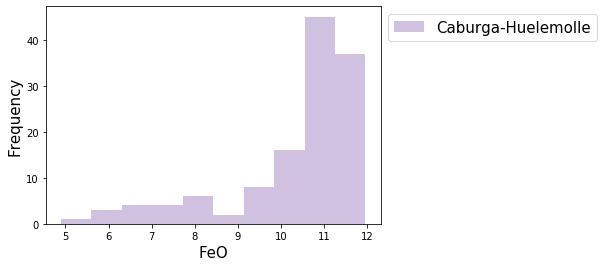

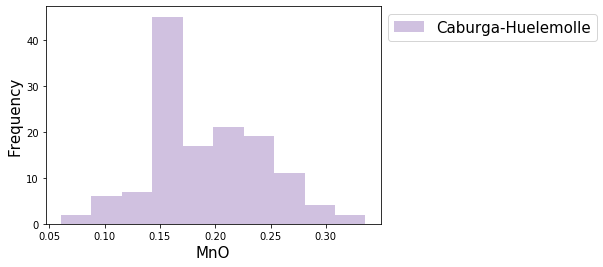

...

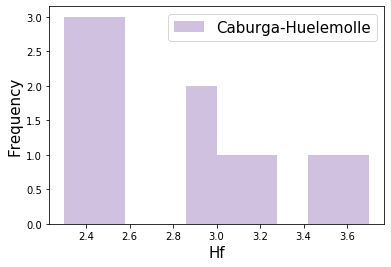

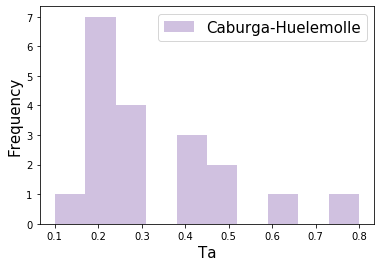

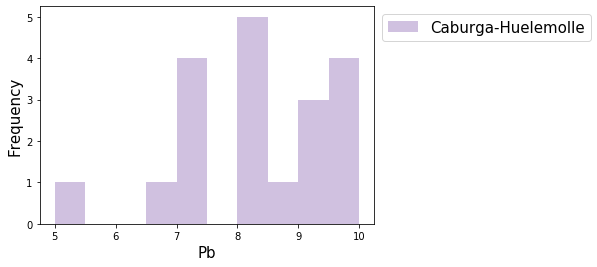

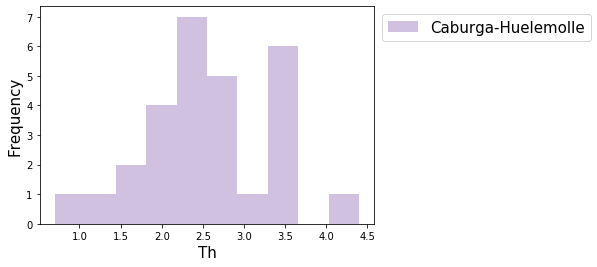

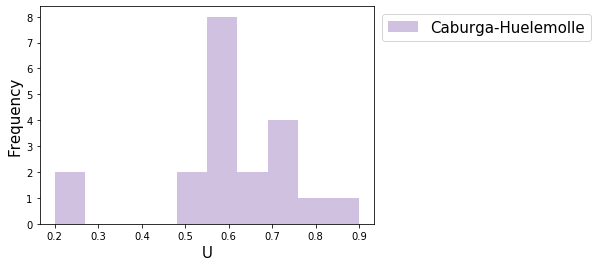

Volcán Yate without information for Magnitud


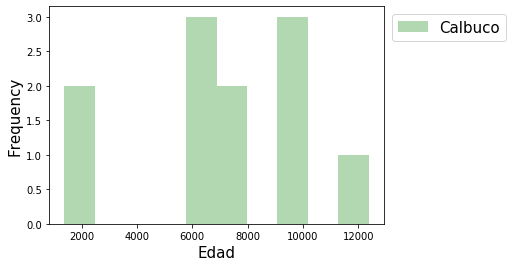

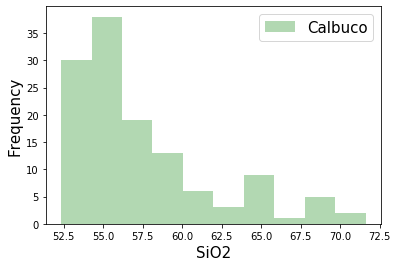

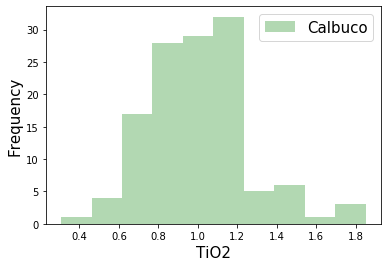

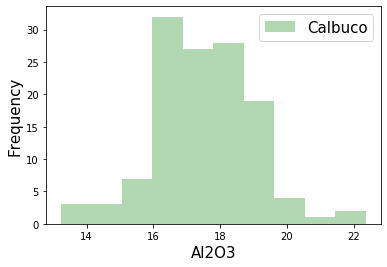

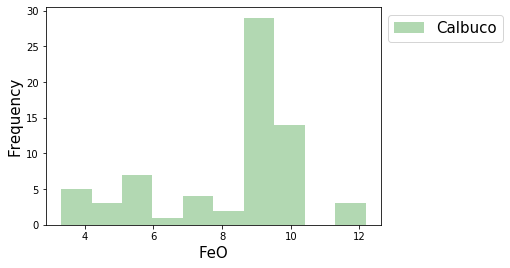

...

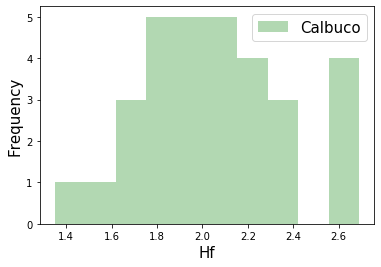

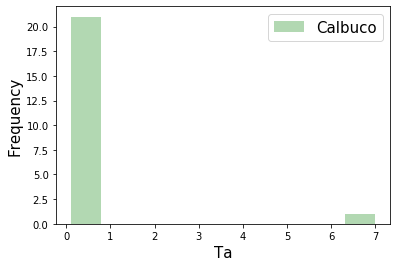

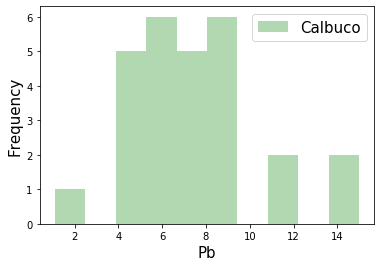

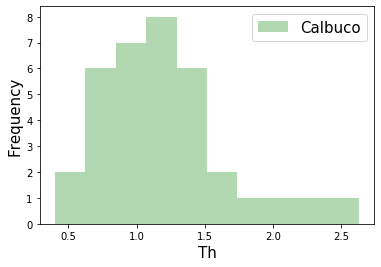

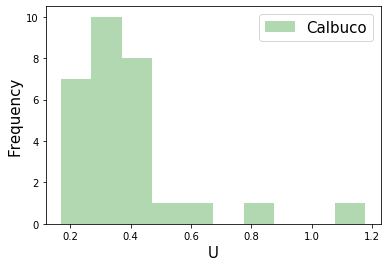

Volcán Yate without information for Magnitud


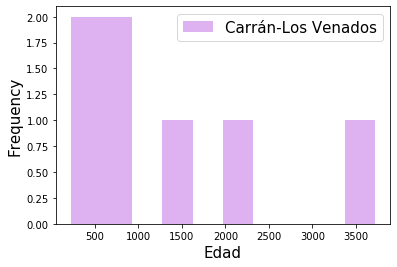

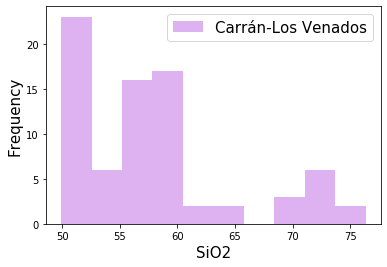

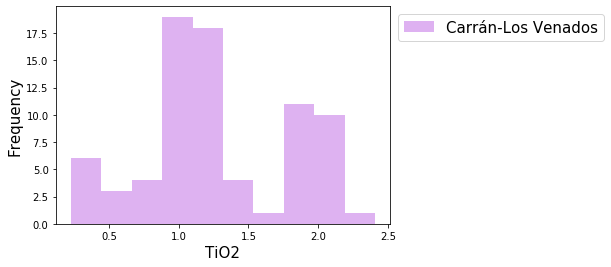

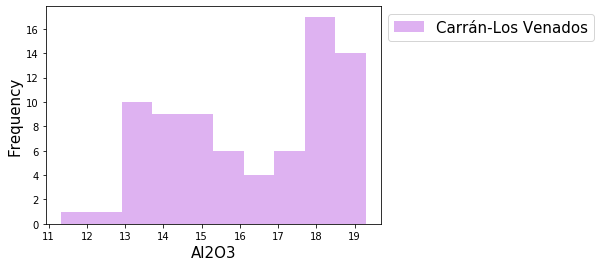

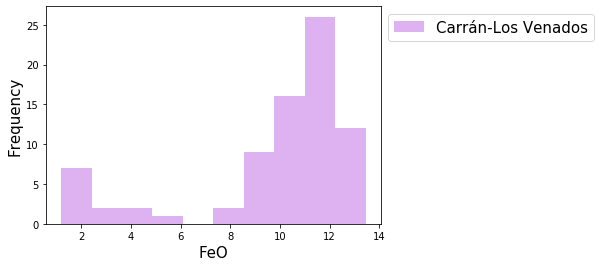

...

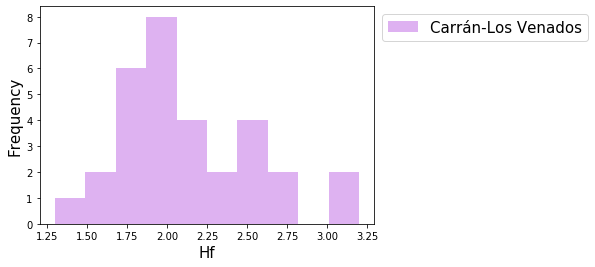

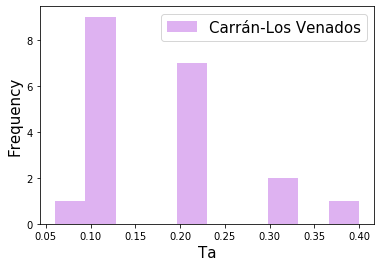

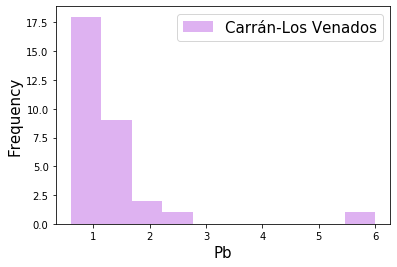

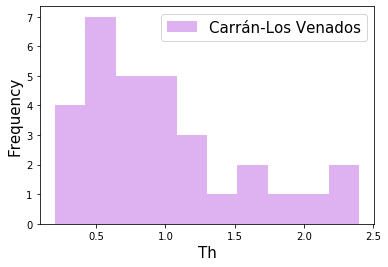

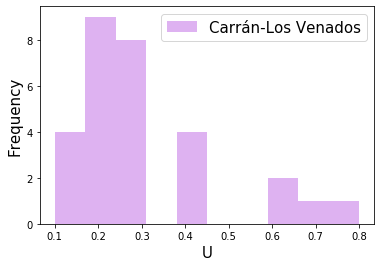

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


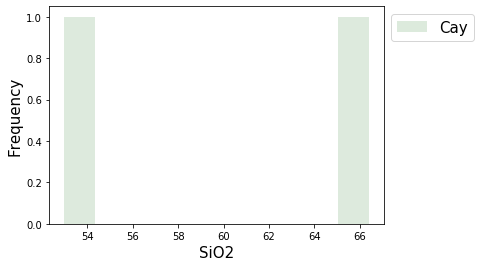

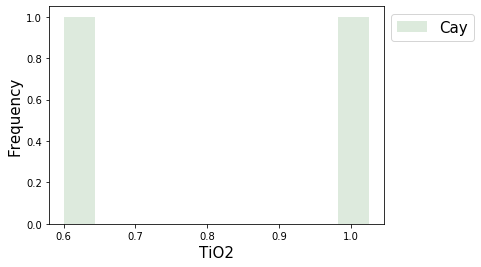

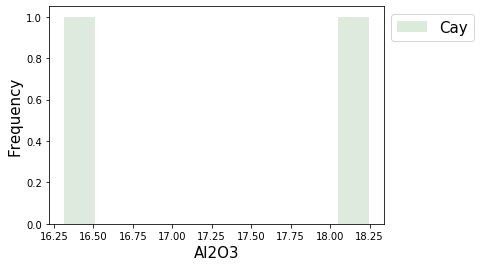

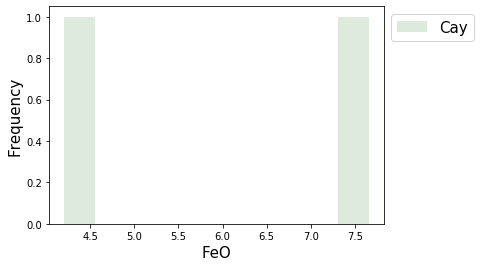

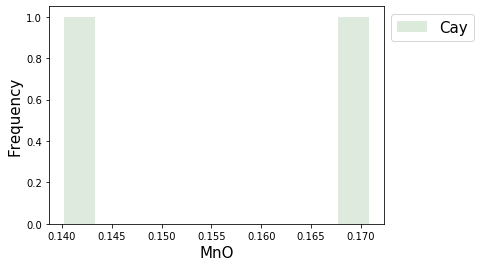

...

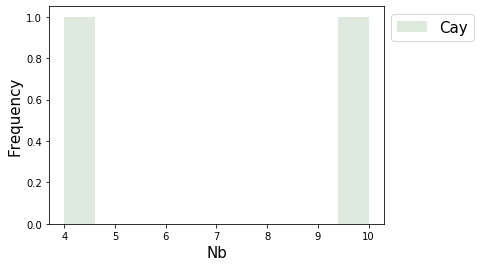

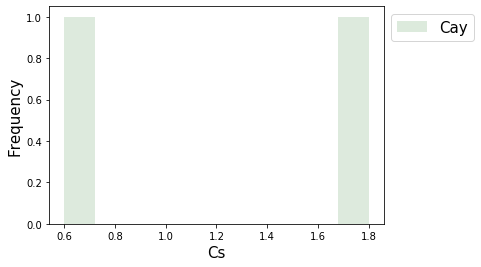

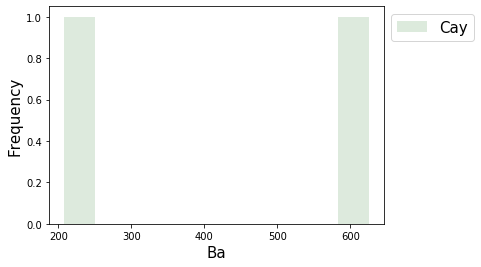

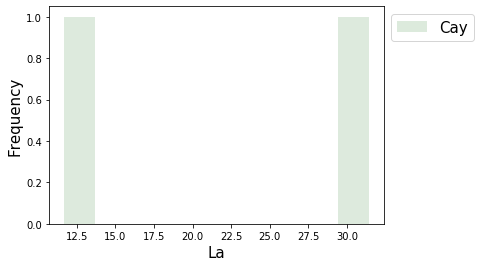

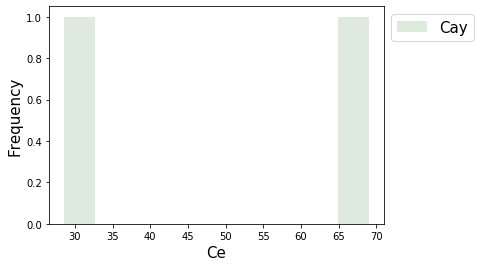

Volcán Yate without information for Pr


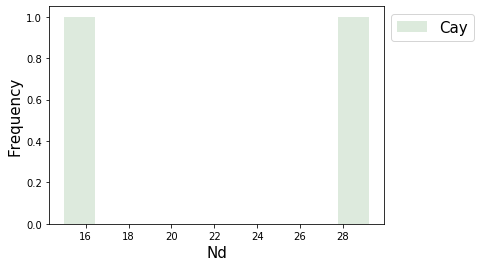

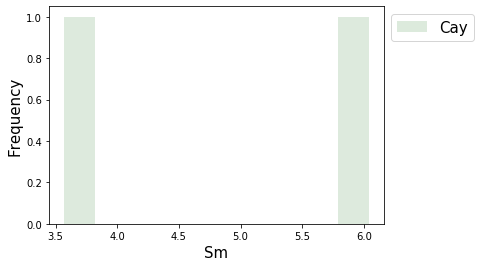

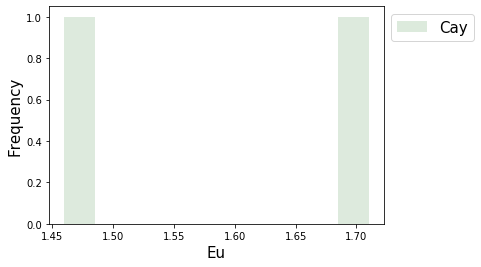

Volcán Yate without information for Gd


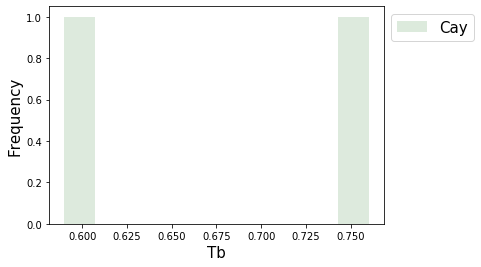

Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm


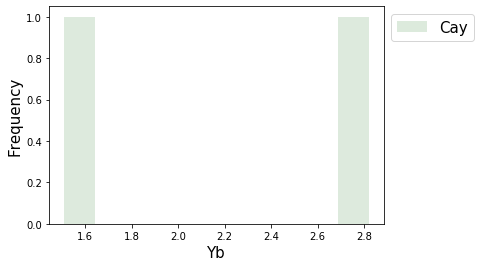

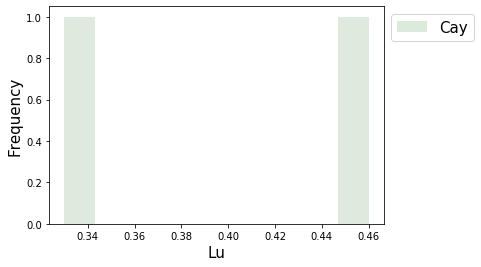

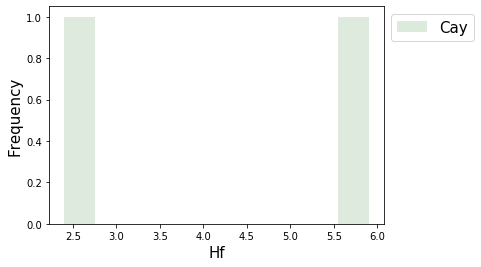

Volcán Yate without information for Ta
Volcán Yate without information for Pb


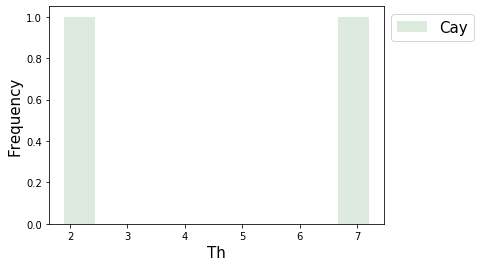

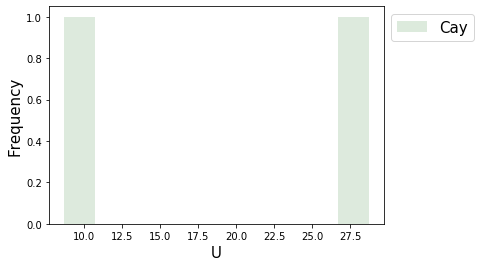

Volcán Yate without information for Magnitud


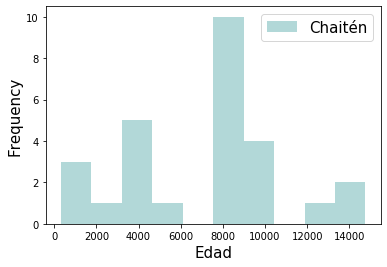

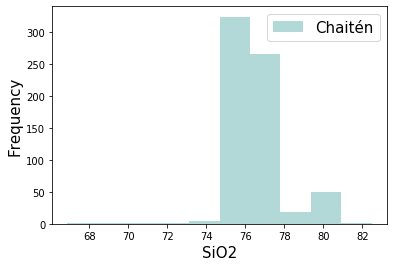

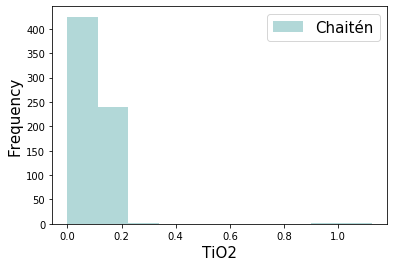

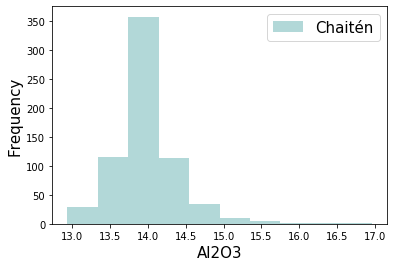

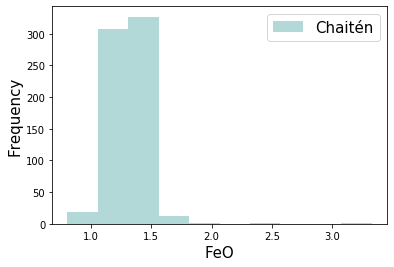

...

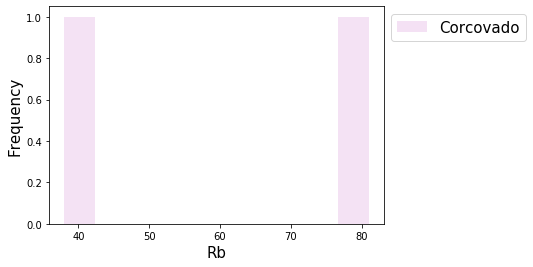

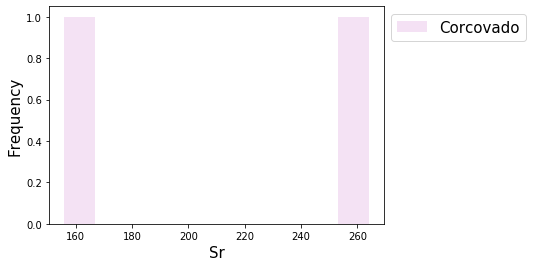

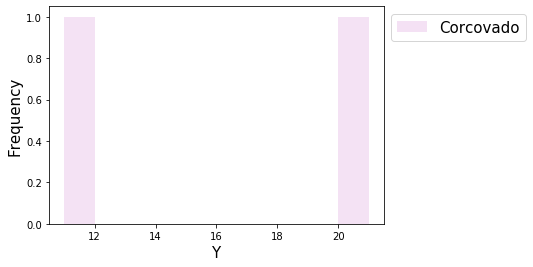

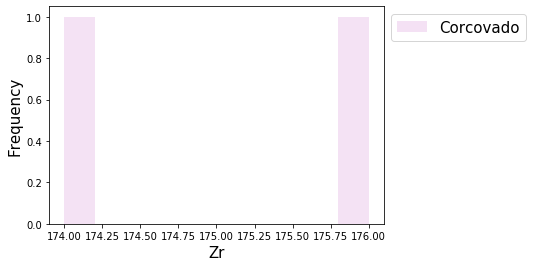

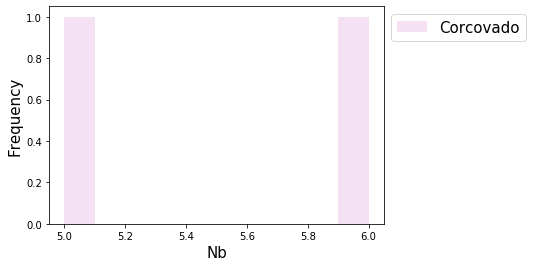

Volcán Yate without information for Cs


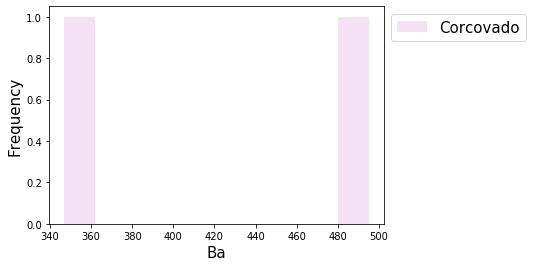

Volcán Yate without information for La
Volcán Yate without information for Ce
Volcán Yate without information for Pr
Volcán Yate without information for Nd
Volcán Yate without information for Sm
Volcán Yate without information for Eu
Volcán Yate without information for Gd
Volcán Yate without information for Tb
Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm
Volcán Yate without information for Yb
Volcán Yate without information for Lu
Volcán Yate without information for Hf
Volcán Yate without information for Ta
Volcán Yate without information for Pb
Volcán Yate without information for Th
Volcán Yate without information for U
Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


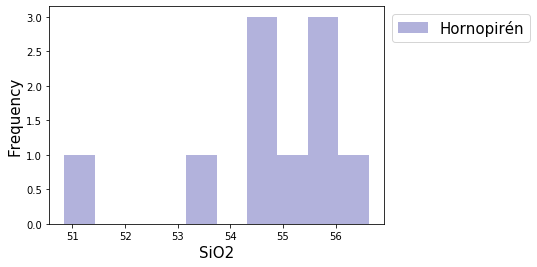

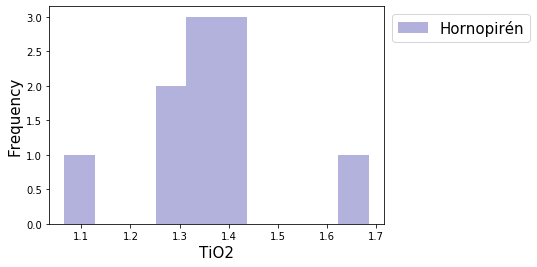

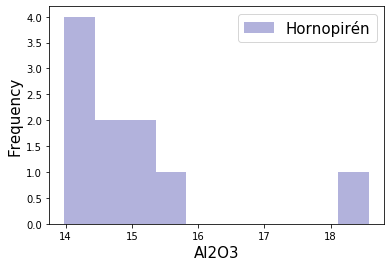

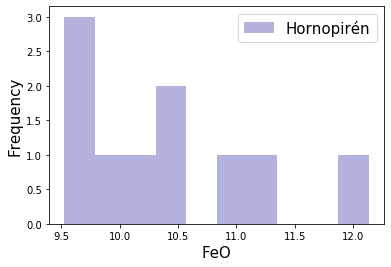

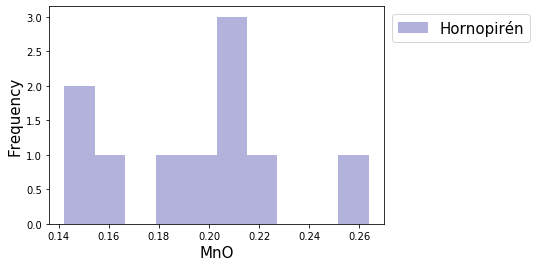

...

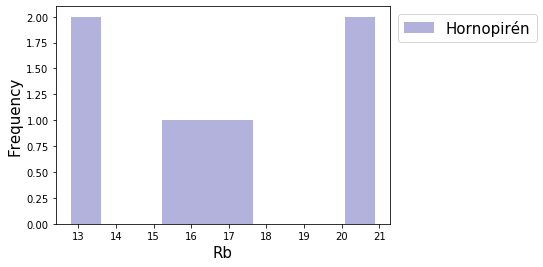

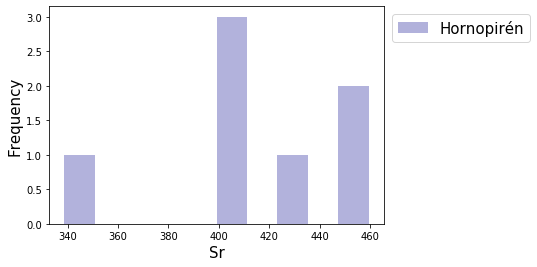

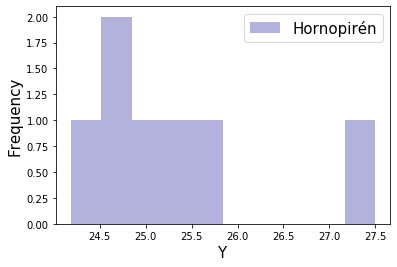

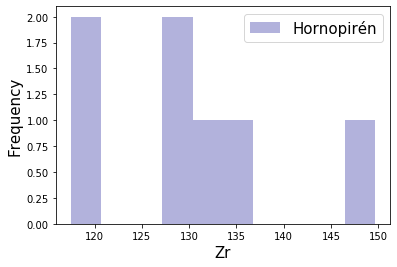

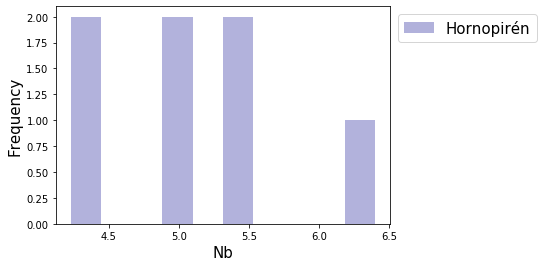

Volcán Yate without information for Cs


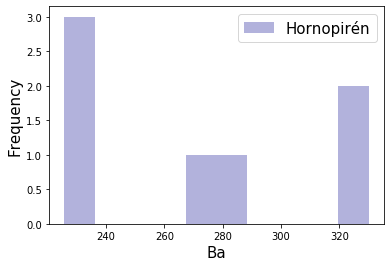

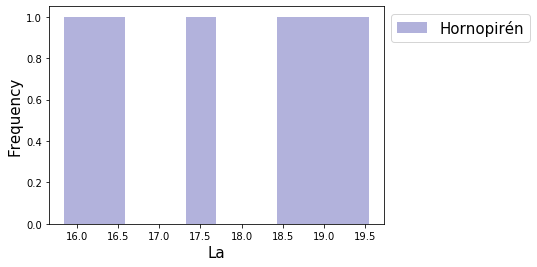

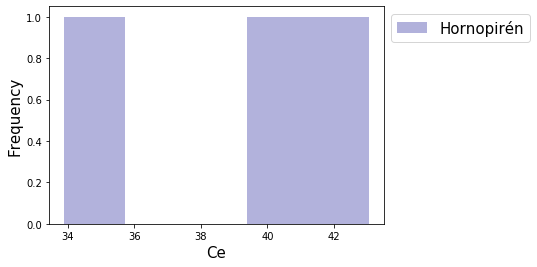

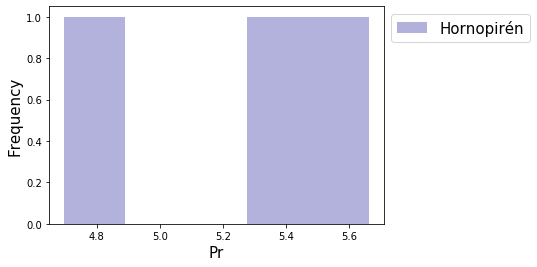

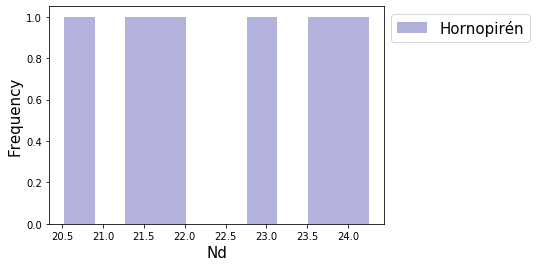

...

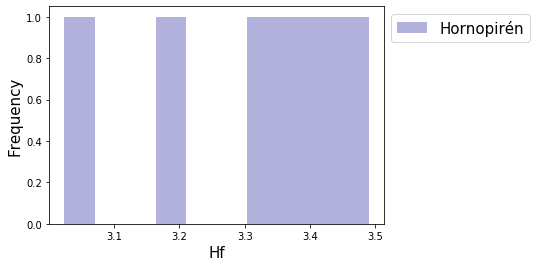

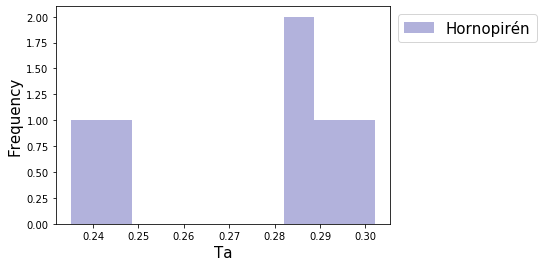

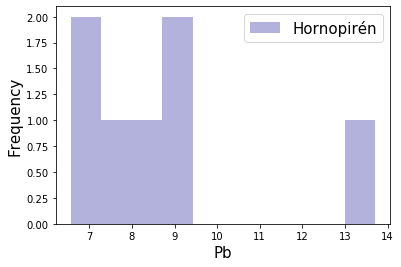

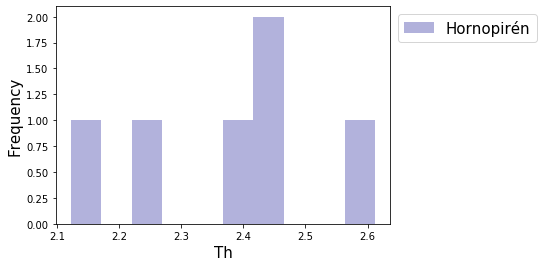

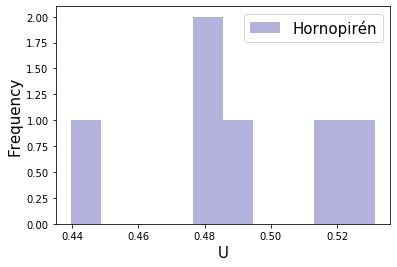

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


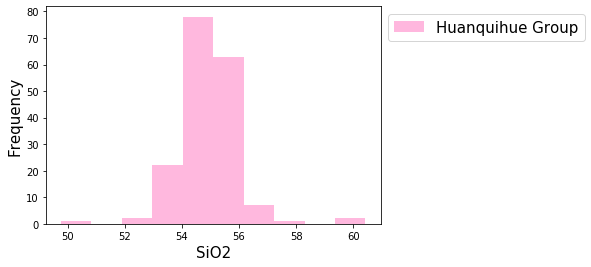

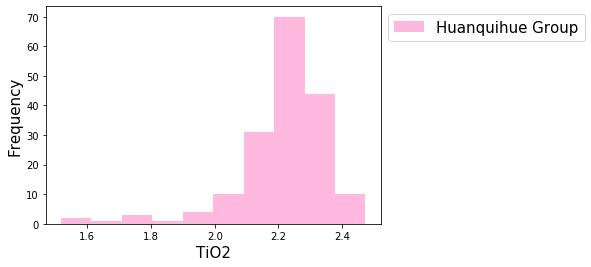

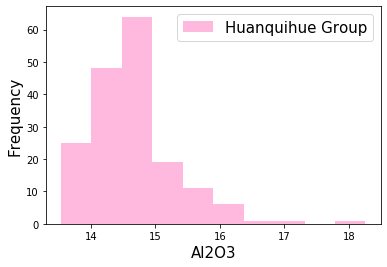

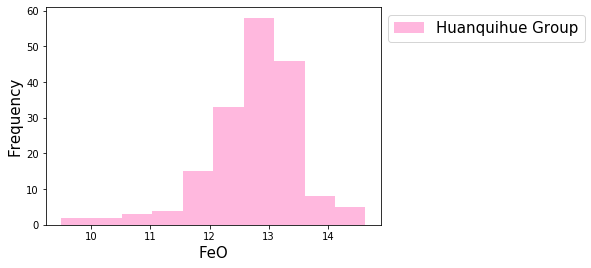

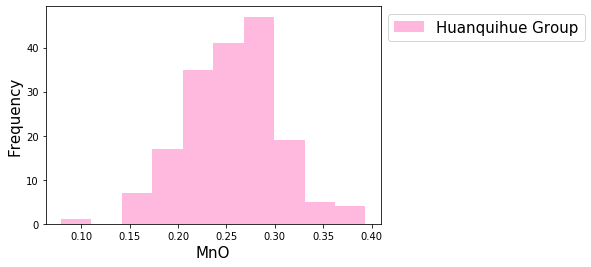

...

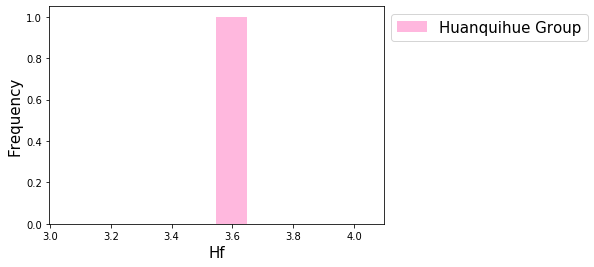

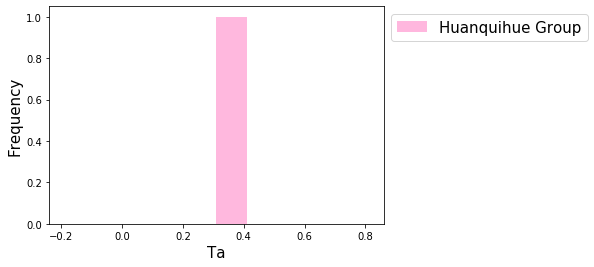

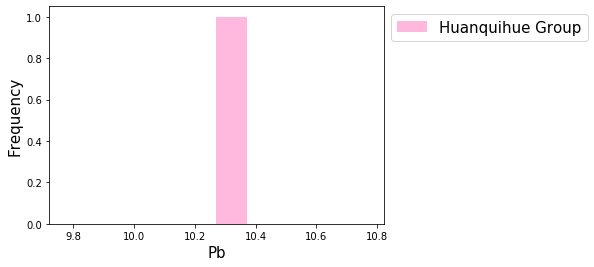

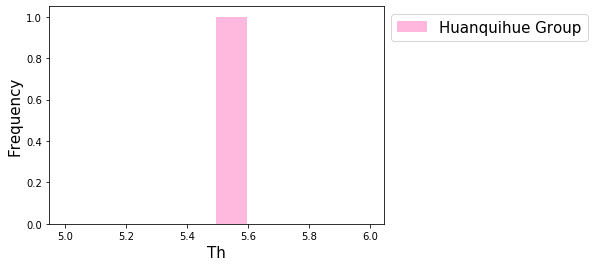

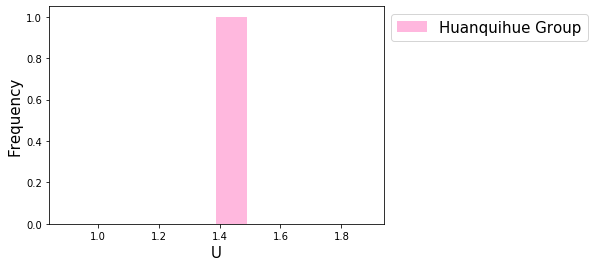

Volcán Yate without information for Magnitud


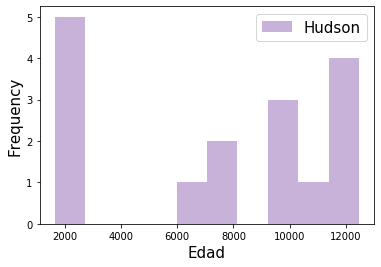

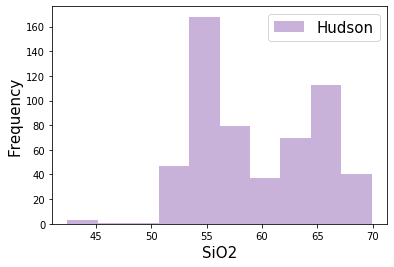

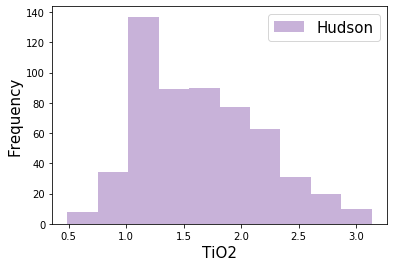

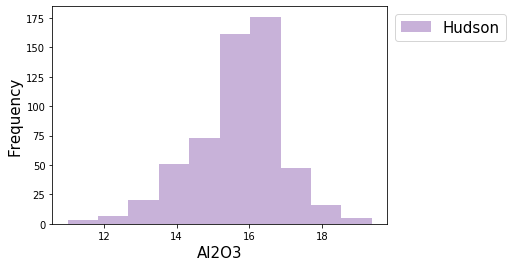

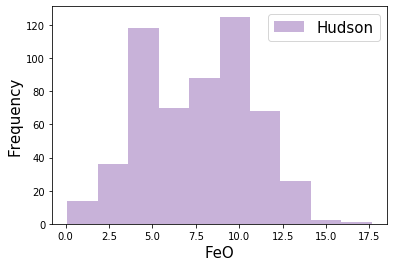

...

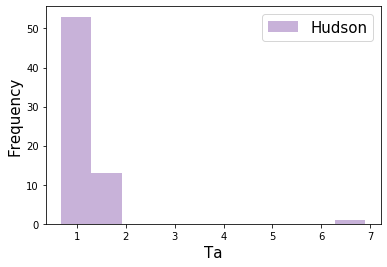

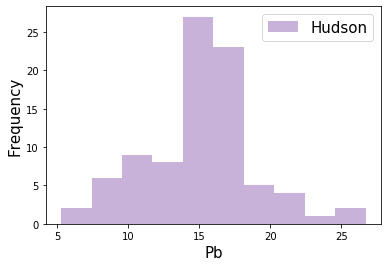

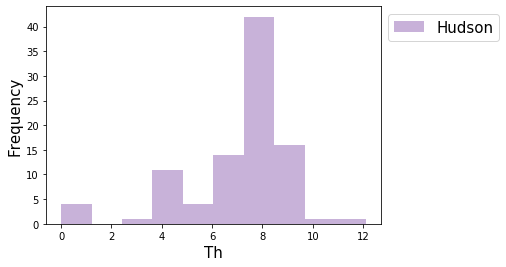

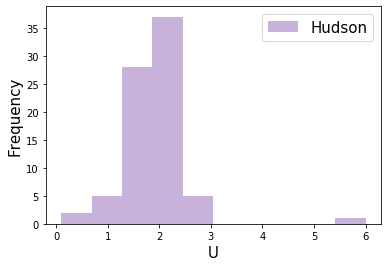

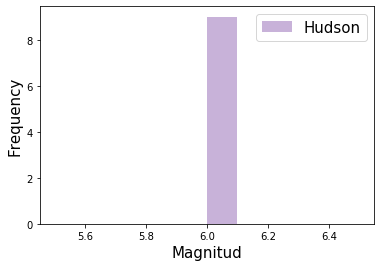

Volcán Yate without information for Edad


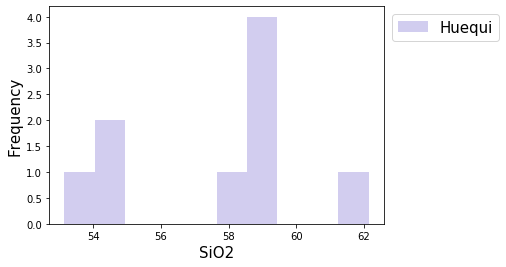

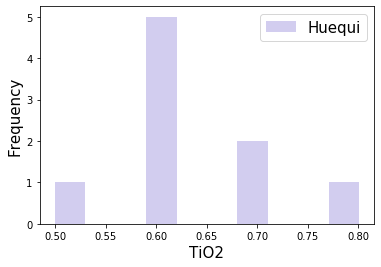

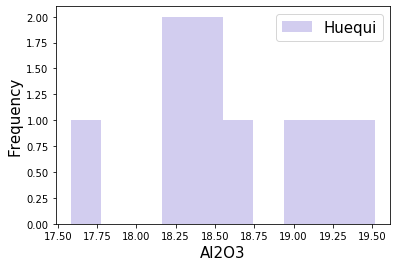

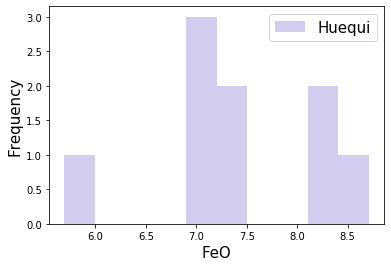

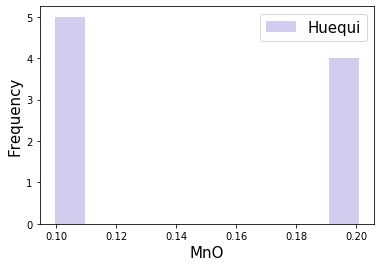

...

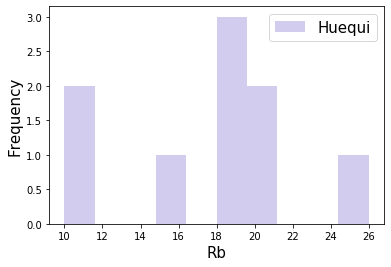

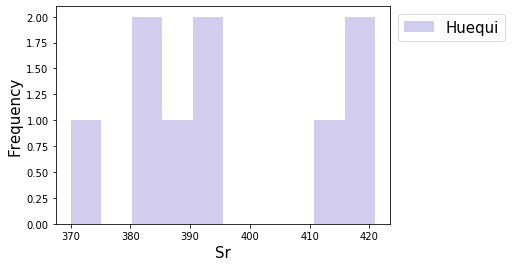

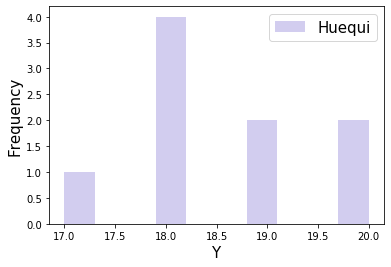

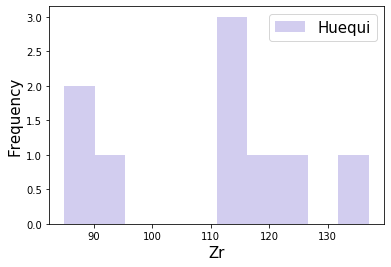

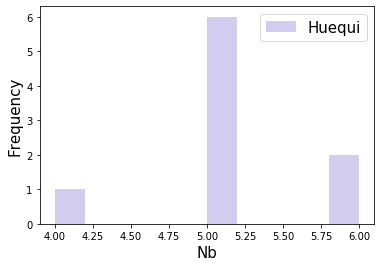

Volcán Yate without information for Cs


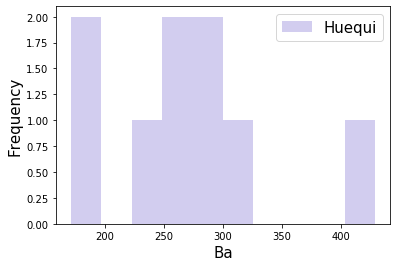

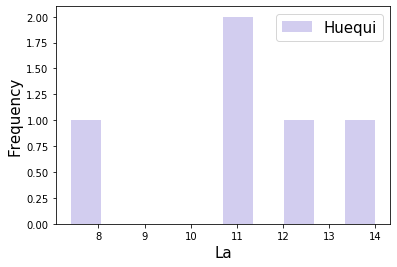

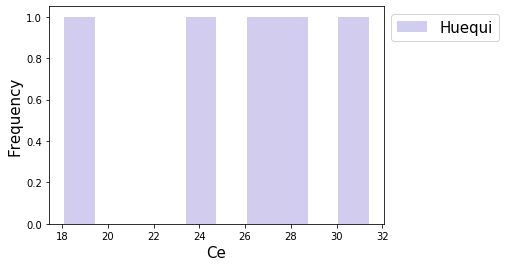

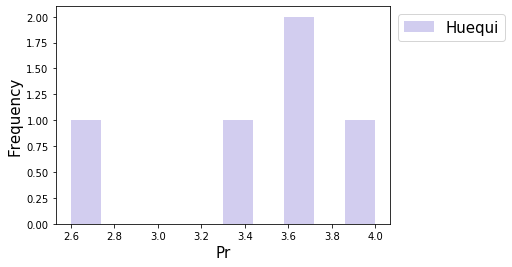

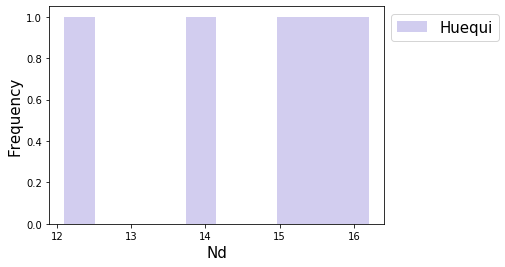

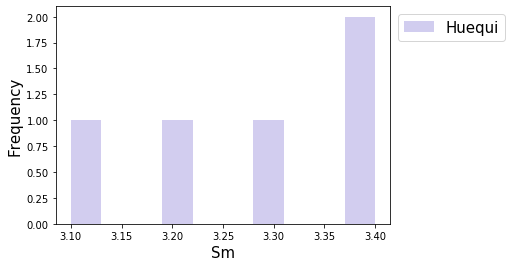

Volcán Yate without information for Eu


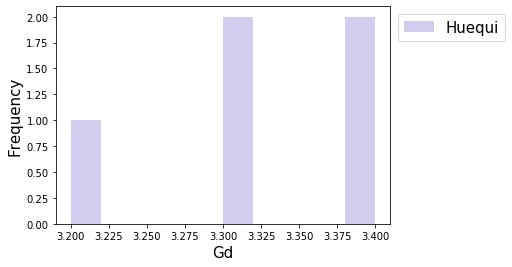

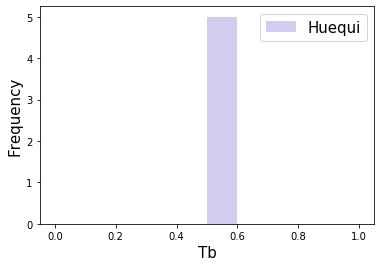

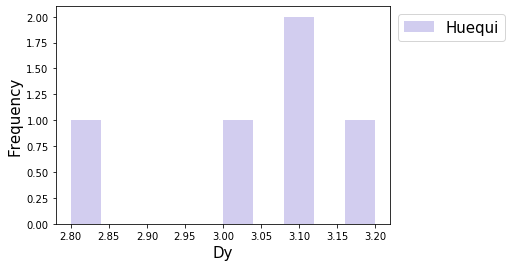

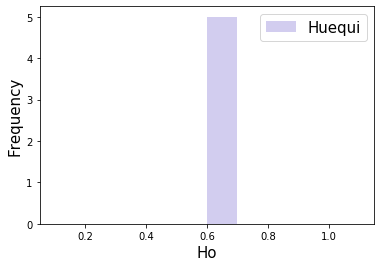

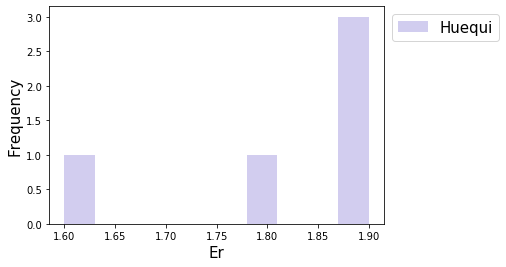

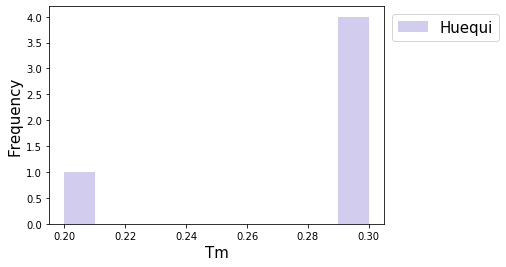

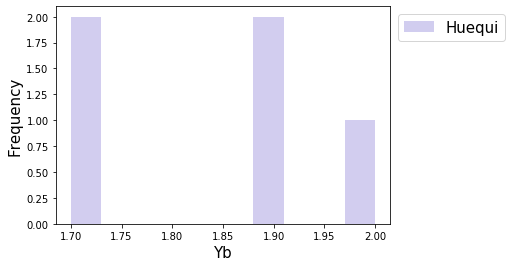

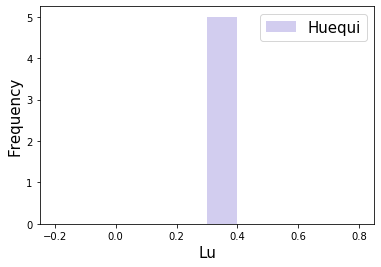

Volcán Yate without information for Hf


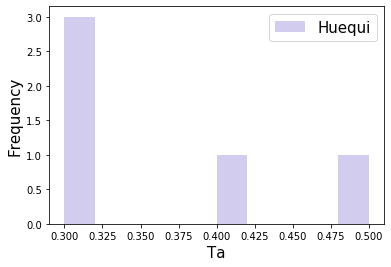

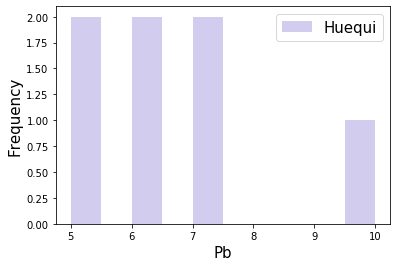

Volcán Yate without information for Th


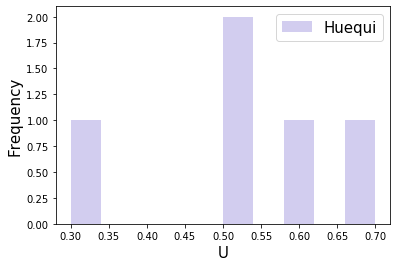

Volcán Yate without information for Magnitud


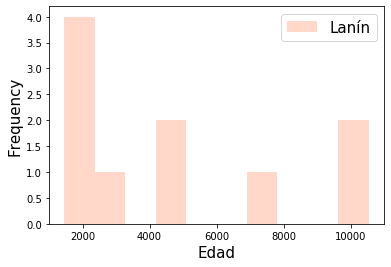

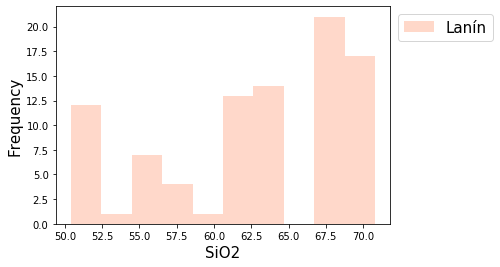

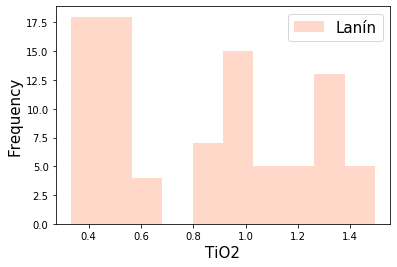

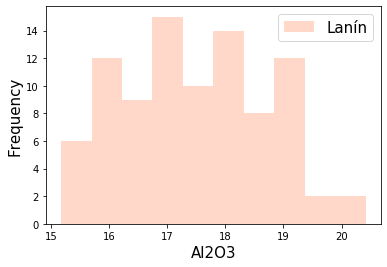

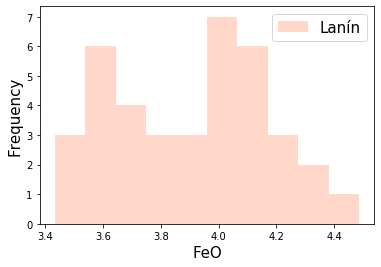

...

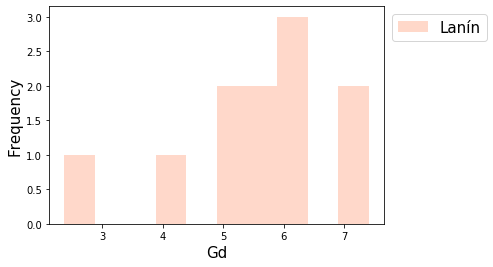

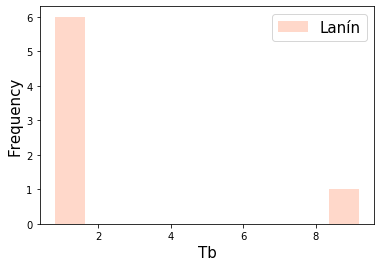

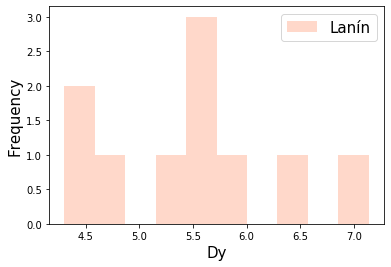

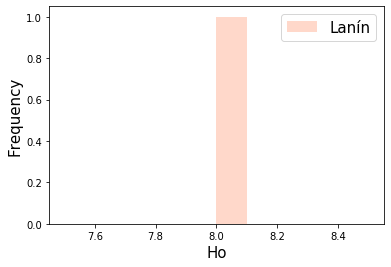

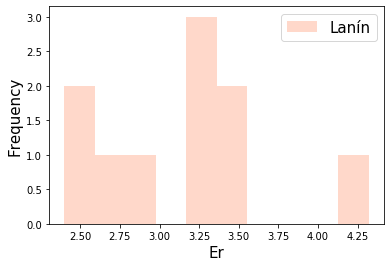

Volcán Yate without information for Tm


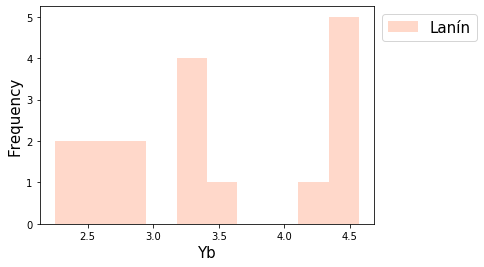

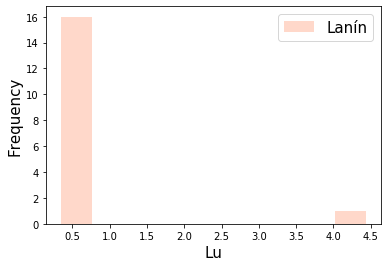

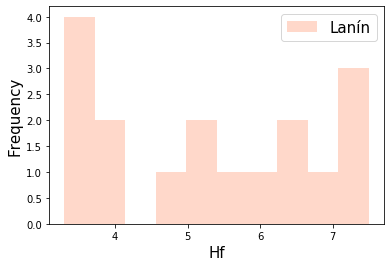

Volcán Yate without information for Ta
Volcán Yate without information for Pb


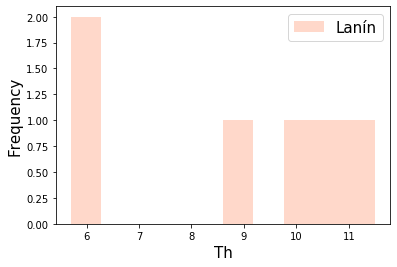

Volcán Yate without information for U
Volcán Yate without information for Magnitud


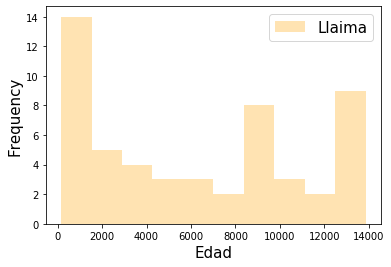

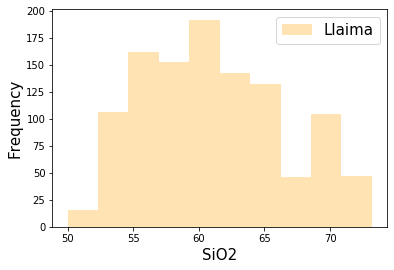

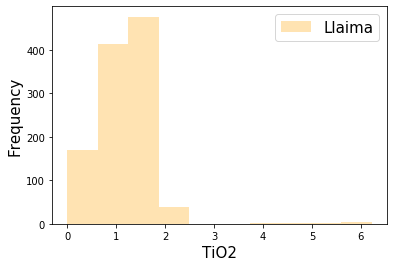

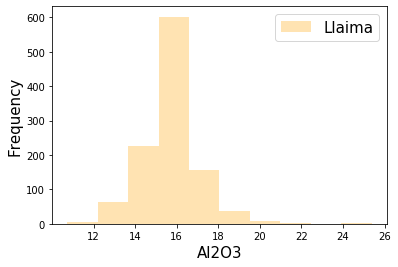

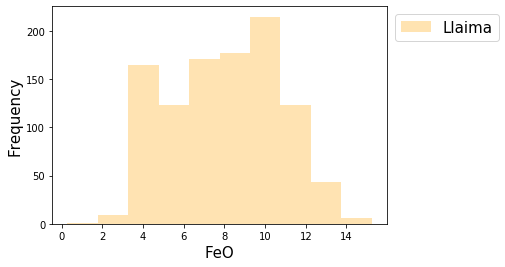

...

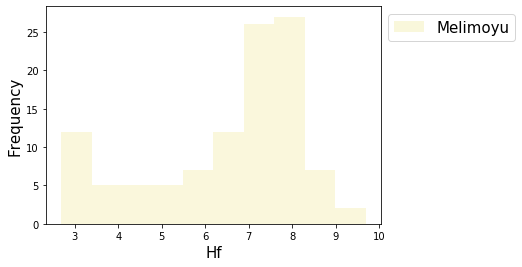

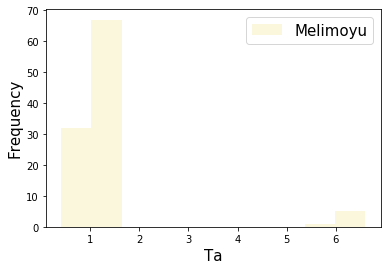

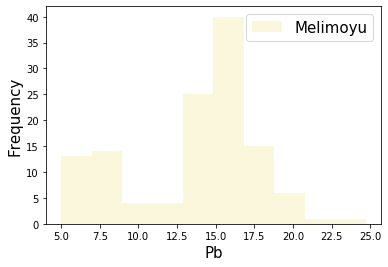

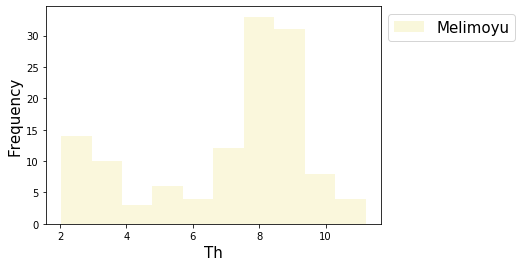

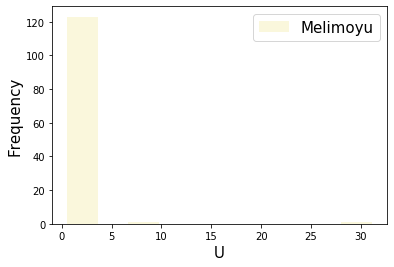

Volcán Yate without information for Magnitud


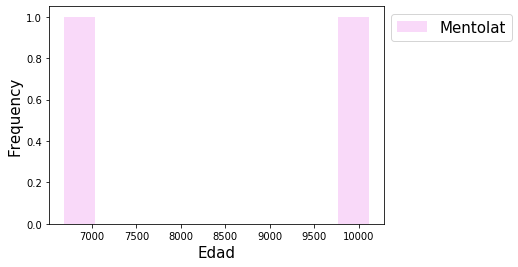

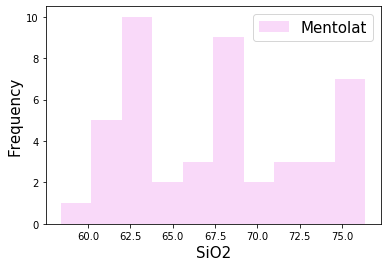

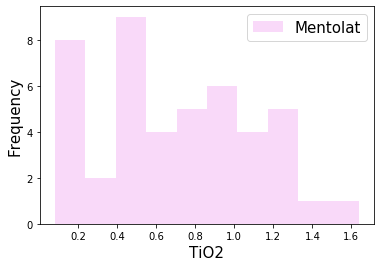

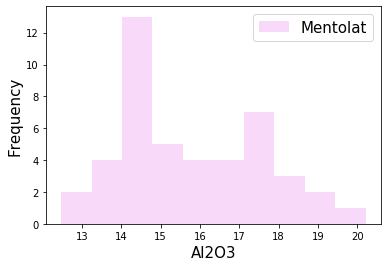

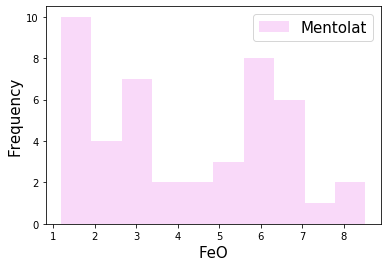

...

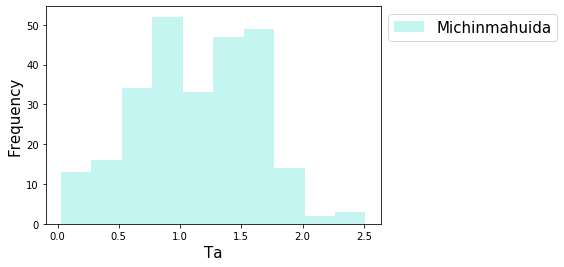

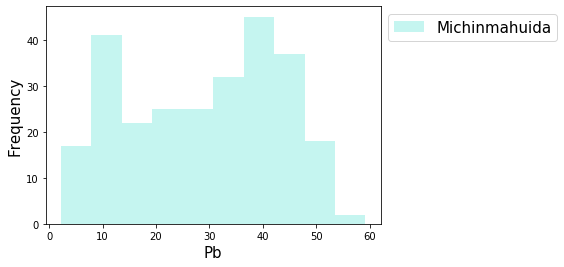

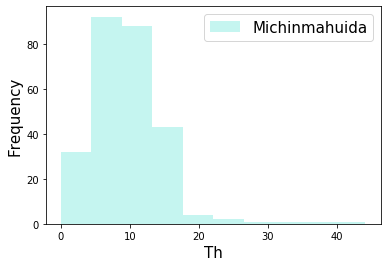

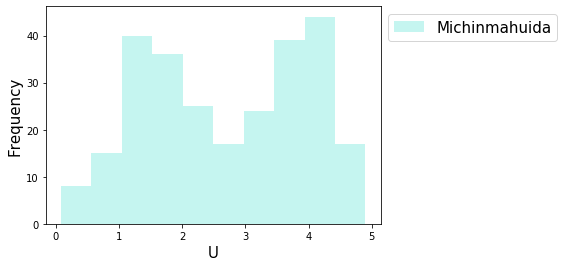

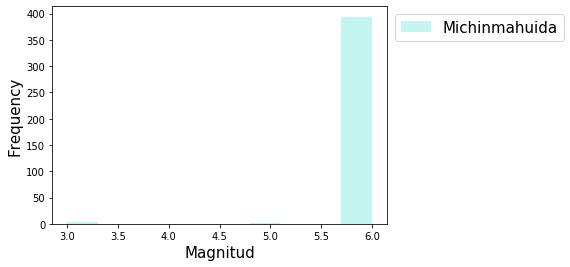

Volcán Yate without information for Edad


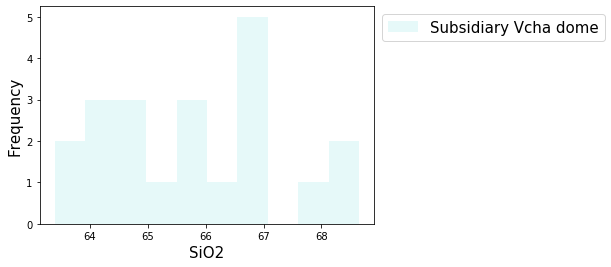

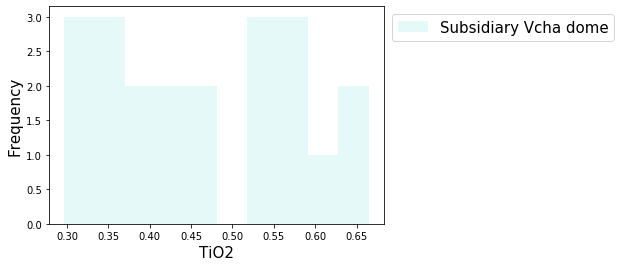

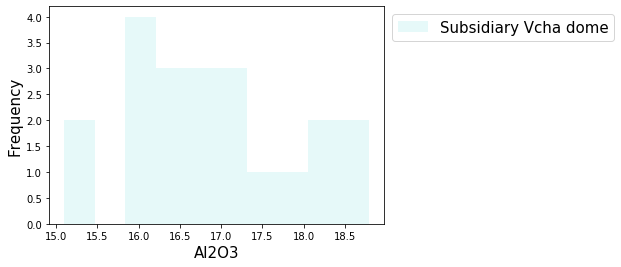

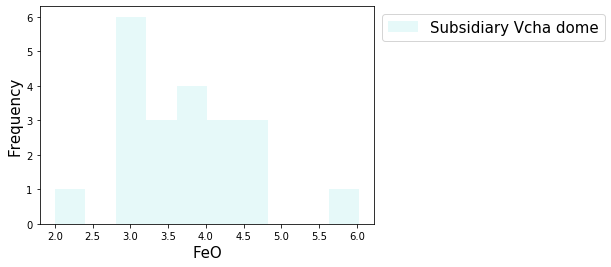

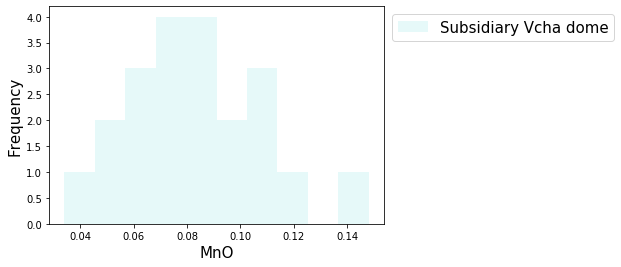

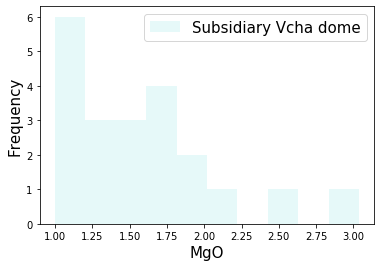

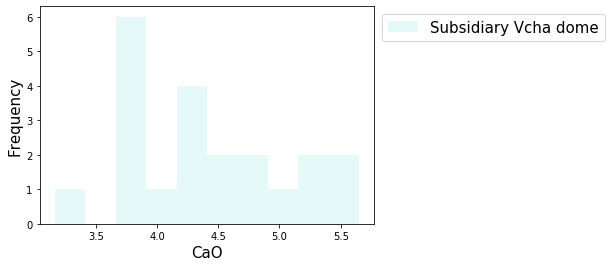

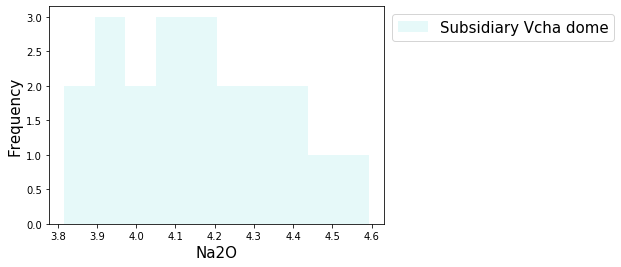

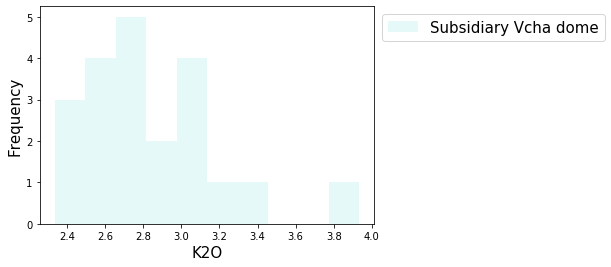

Volcán Yate without information for P2O5
Volcán Yate without information for Rb
Volcán Yate without information for Sr
Volcán Yate without information for Y
Volcán Yate without information for Zr
Volcán Yate without information for Nb
Volcán Yate without information for Cs
Volcán Yate without information for Ba
Volcán Yate without information for La
Volcán Yate without information for Ce
Volcán Yate without information for Pr
Volcán Yate without information for Nd
Volcán Yate without information for Sm
Volcán Yate without information for Eu
Volcán Yate without information for Gd
Volcán Yate without information for Tb
Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm
Volcán Yate without information for Yb
Volcán Yate without information for Lu
Volcán Yate without information for Hf
Volcán Yate without information for Ta
Volcán Yate without information for Pb
Volcán Yate without info

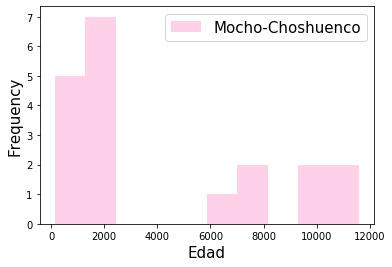

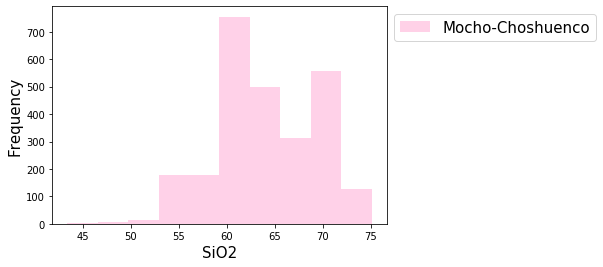

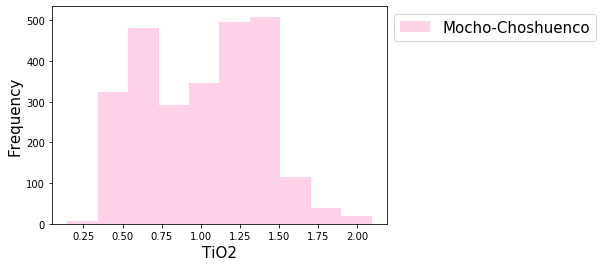

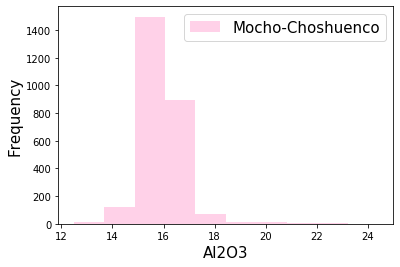

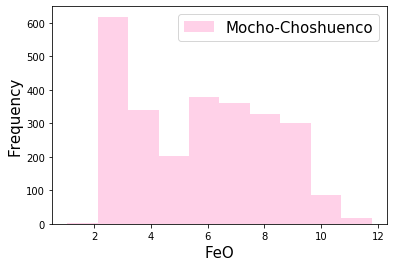

...

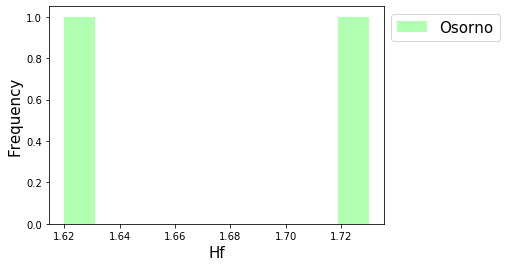

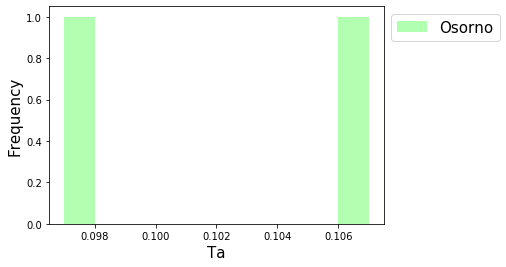

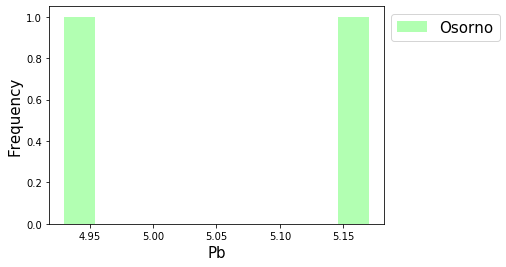

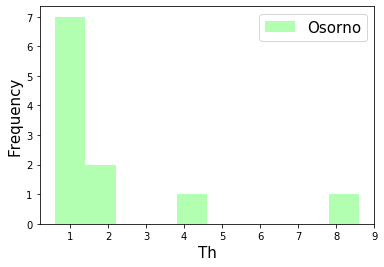

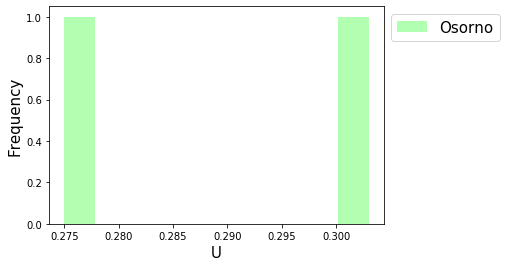

Volcán Yate without information for Magnitud


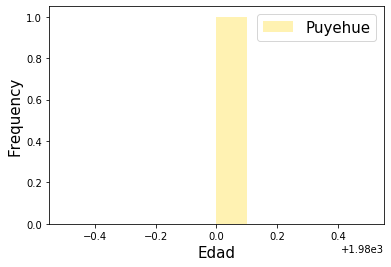

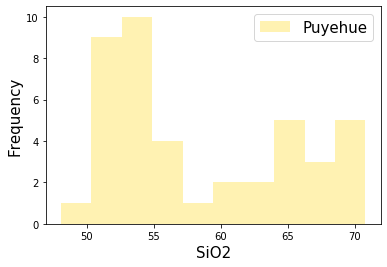

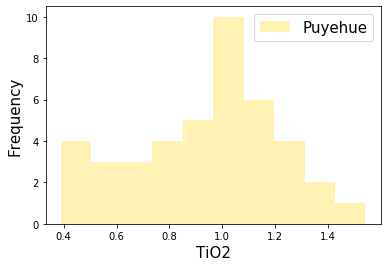

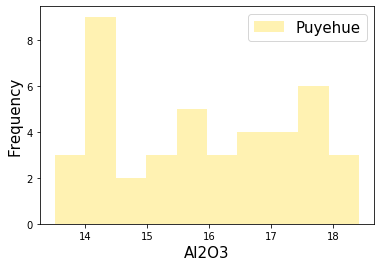

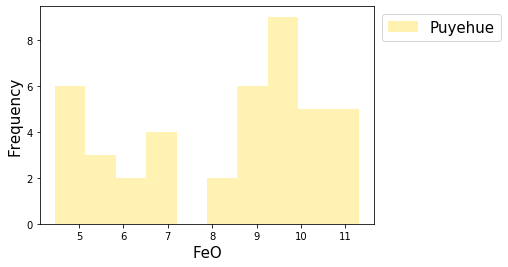

...

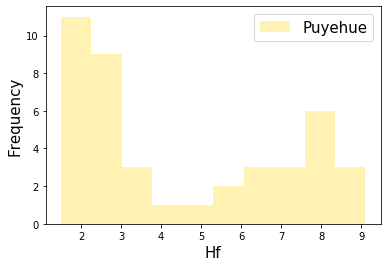

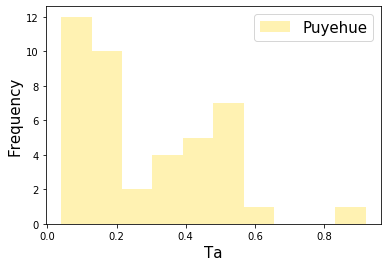

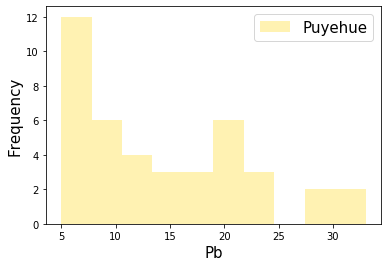

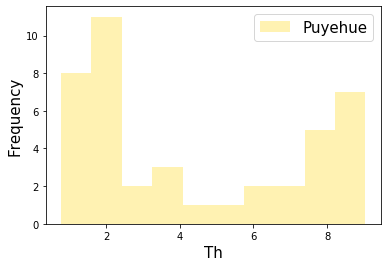

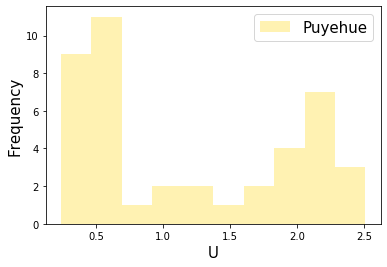

Volcán Yate without information for Magnitud


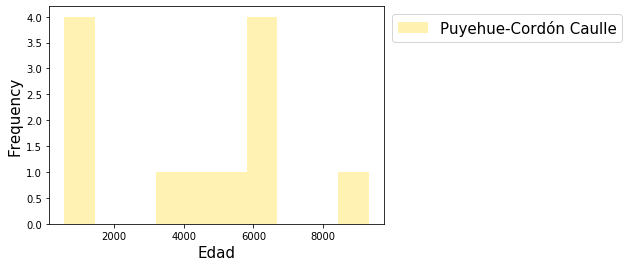

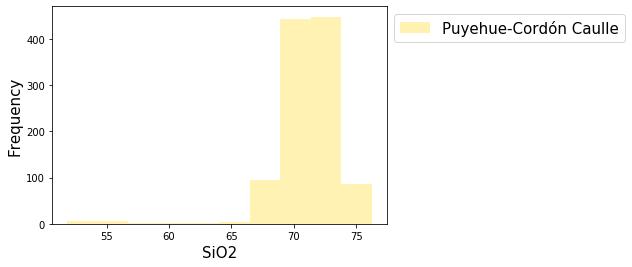

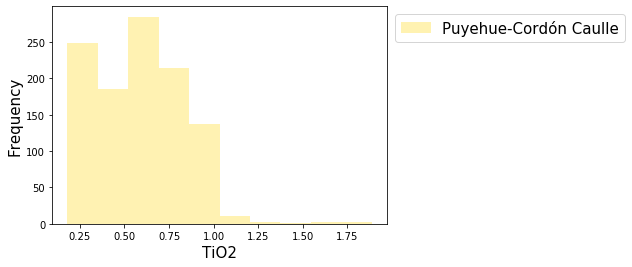

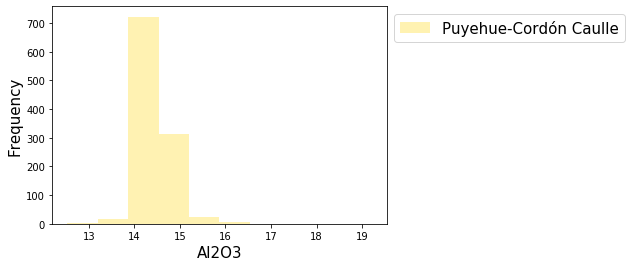

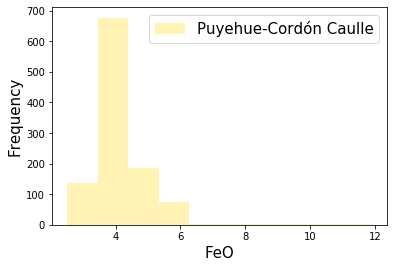

...

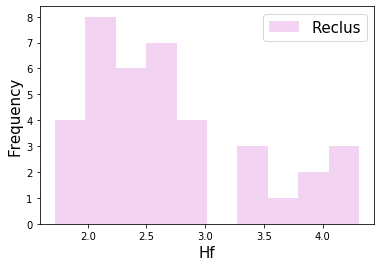

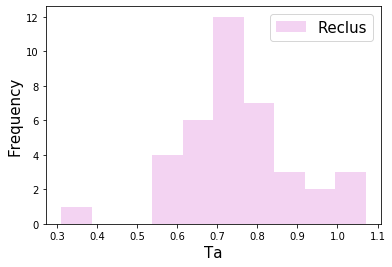

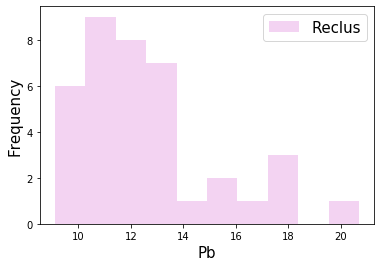

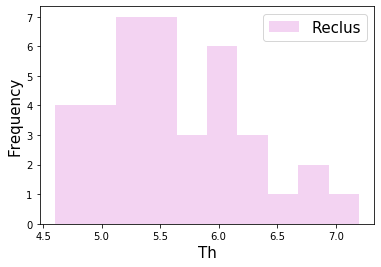

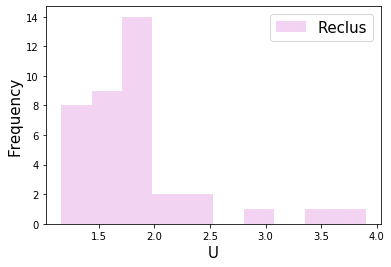

Volcán Yate without information for Magnitud


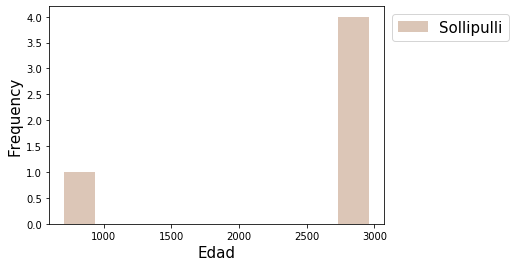

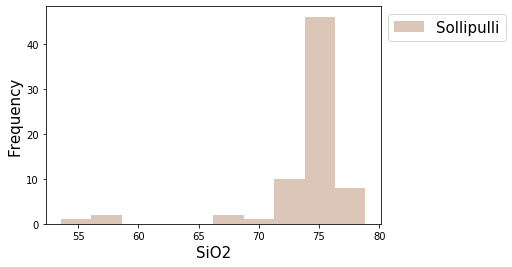

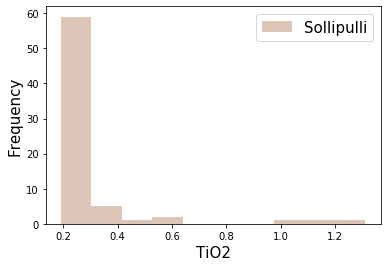

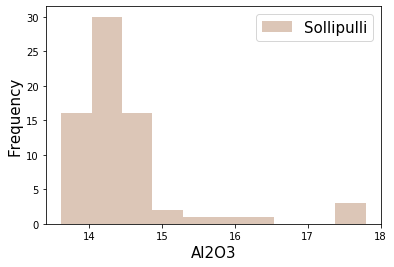

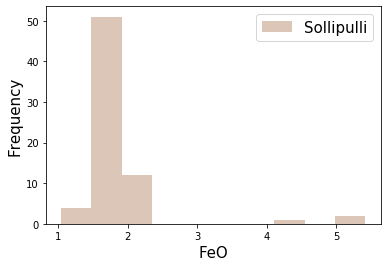

...

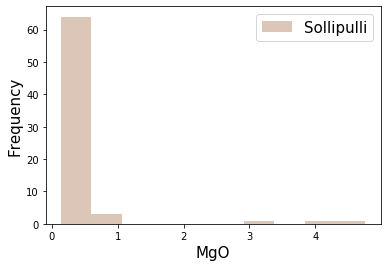

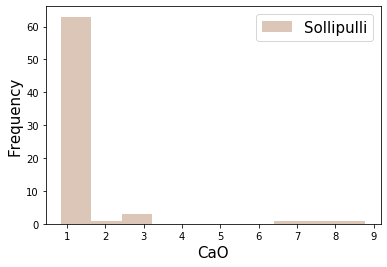

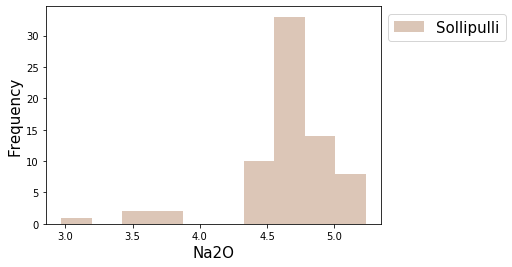

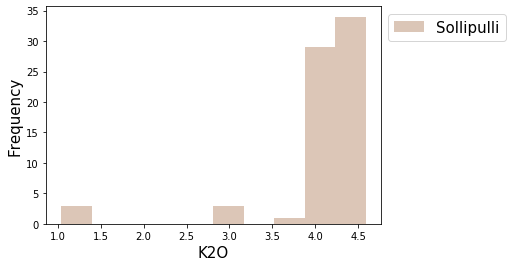

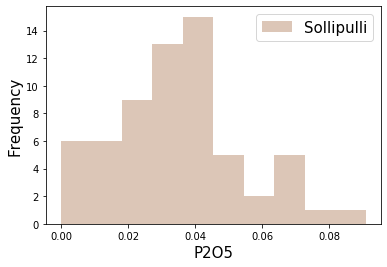

Volcán Yate without information for Rb
Volcán Yate without information for Sr
Volcán Yate without information for Y
Volcán Yate without information for Zr
Volcán Yate without information for Nb
Volcán Yate without information for Cs
Volcán Yate without information for Ba
Volcán Yate without information for La
Volcán Yate without information for Ce
Volcán Yate without information for Pr
Volcán Yate without information for Nd
Volcán Yate without information for Sm
Volcán Yate without information for Eu
Volcán Yate without information for Gd
Volcán Yate without information for Tb
Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm
Volcán Yate without information for Yb
Volcán Yate without information for Lu
Volcán Yate without information for Hf
Volcán Yate without information for Ta
Volcán Yate without information for Pb
Volcán Yate without information for Th
Volcán Yate without inform

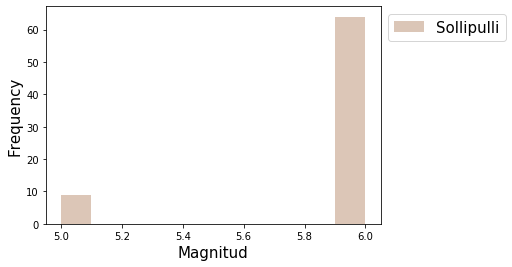

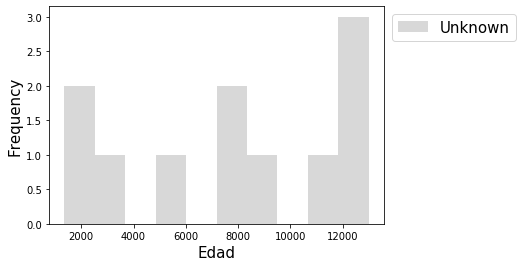

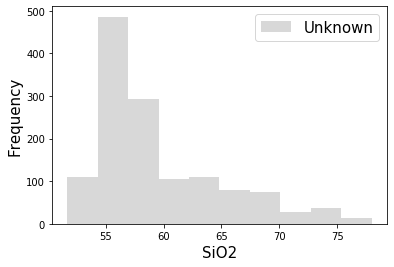

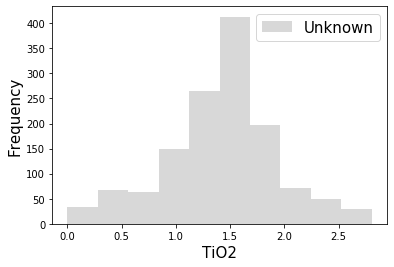

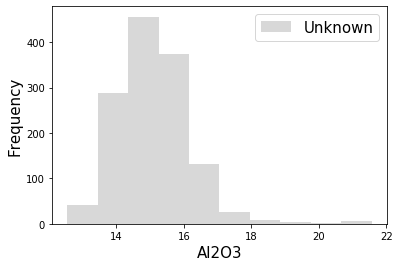

...

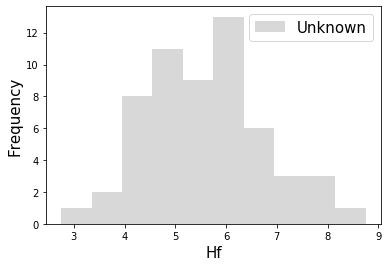

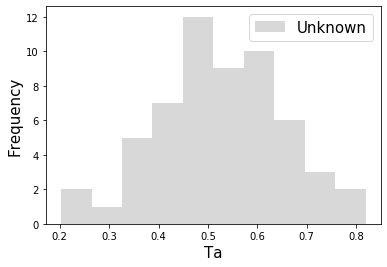

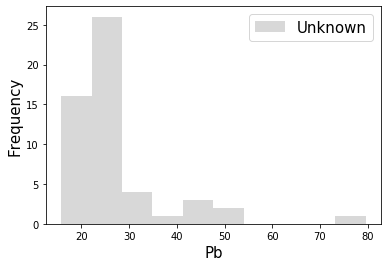

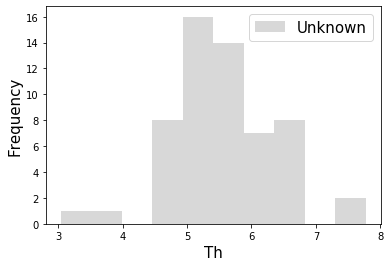

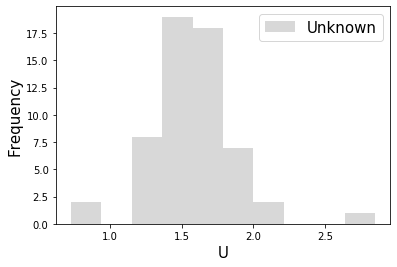

Volcán Yate without information for Magnitud


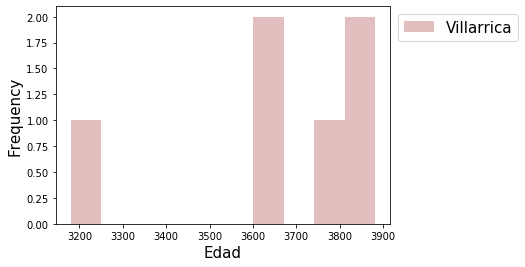

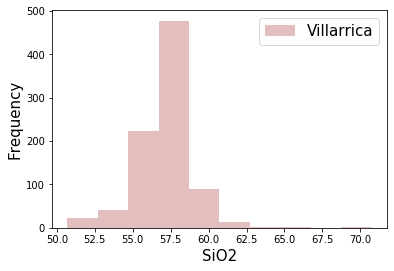

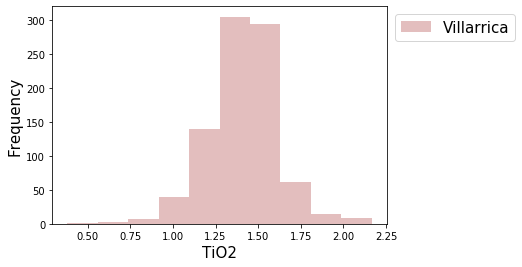

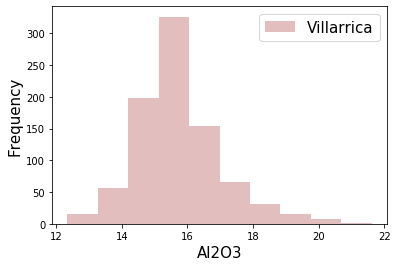

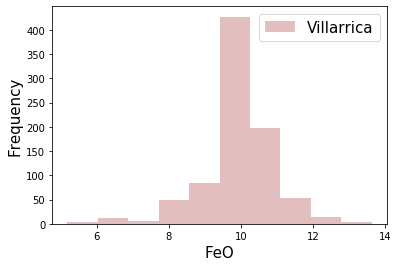

...

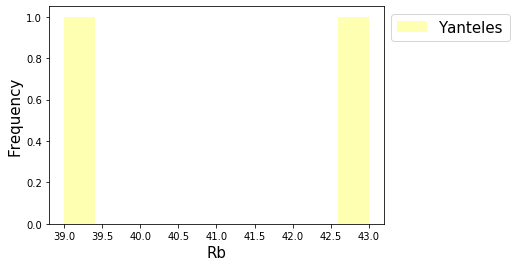

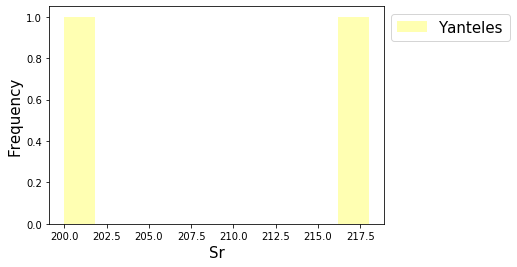

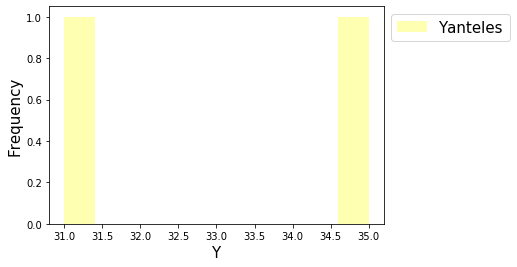

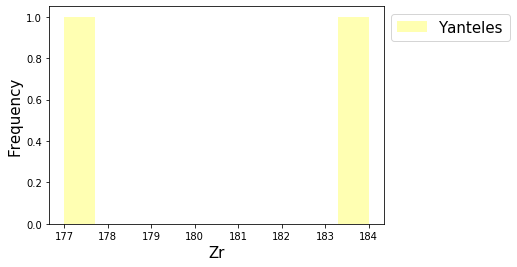

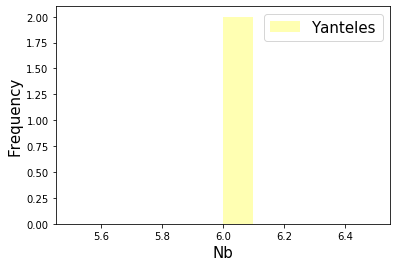

Volcán Yate without information for Cs


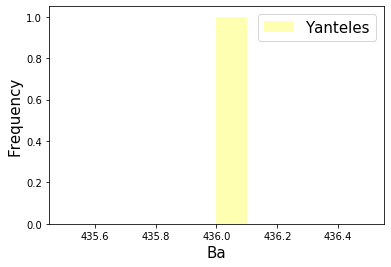

Volcán Yate without information for La
Volcán Yate without information for Ce
Volcán Yate without information for Pr
Volcán Yate without information for Nd
Volcán Yate without information for Sm
Volcán Yate without information for Eu
Volcán Yate without information for Gd
Volcán Yate without information for Tb
Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm
Volcán Yate without information for Yb
Volcán Yate without information for Lu
Volcán Yate without information for Hf
Volcán Yate without information for Ta
Volcán Yate without information for Pb
Volcán Yate without information for Th
Volcán Yate without information for U
Volcán Yate without information for Magnitud


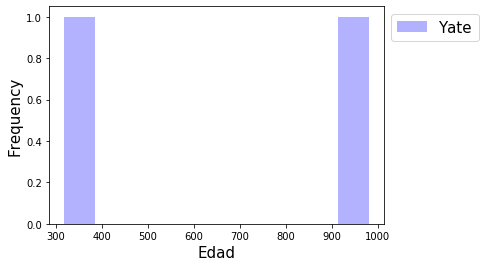

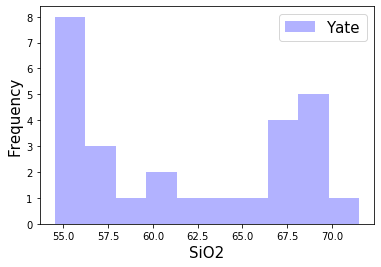

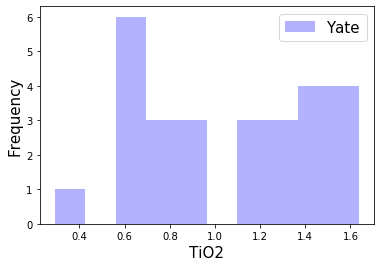

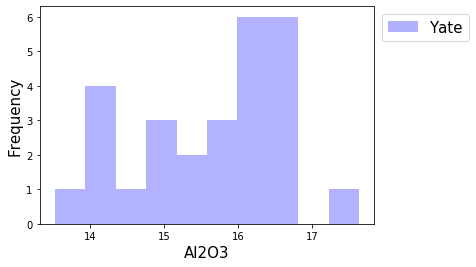

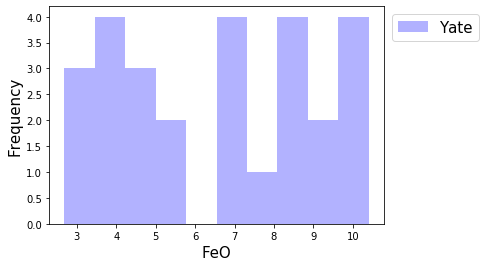

...

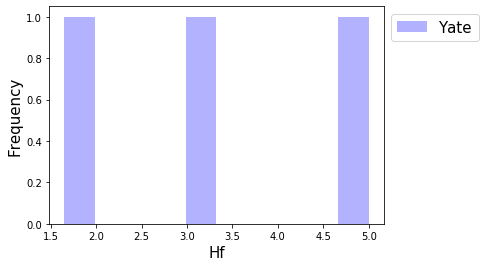

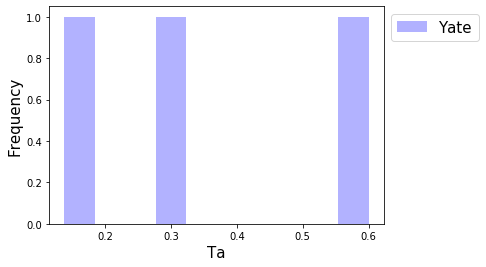

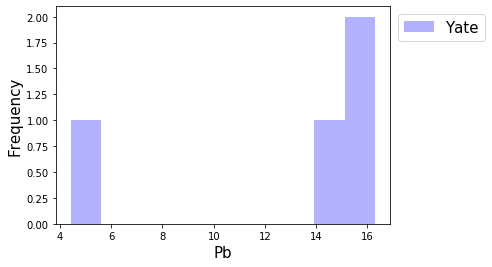

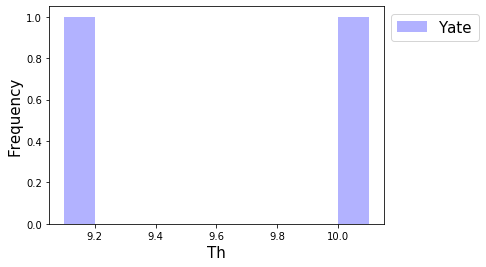

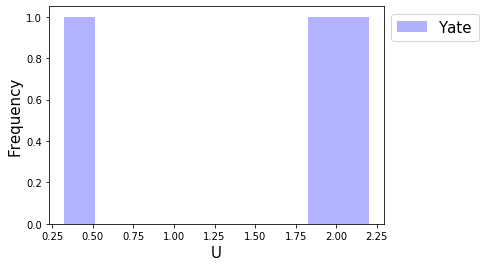

Volcán Yate without information for Magnitud


In [28]:
DatA = Data_temp
volcanes = DatA['Volcán'].unique()
for volcan in volcanes:
    Data_volcan = DatA[DatA['Volcán']==volcan]

    for elemento in DatA.columns :   
        if (elemento != 'Volcán')&(elemento != 'Evento'):   
            coloR, Marker  = simbologia(volcan,'Unknown')
            if pd.isnull(Data_volcan[elemento]).all():
                print('Volcán {} without information for {}'.format(i,elemento))   
            else:
                plt.hist(Data_volcan[elemento] ,label= volcan, color = coloR, alpha= 0.3,range=(np.nanmin(Data_volcan[elemento]), np.nanmax(Data_volcan[elemento])))  
                plt.xlabel(elemento, fontsize=15)
                plt.ylabel('Frequency', fontsize=15)
                plt.legend(bbox_to_anchor=(1,1),ncol=2, fontsize=15)
                plt.show()

# Explore data by blocks of measurements

Broadly, three types of measurements are included in the data base: Mayor elements, Trace elements and Age. This information is provided by the function MissingMechanisms in functions.py. The functions takes some time to compute so after running it, the reesult is stored in ../xlsx

In [3]:
Data = pd.read_excel("../TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data_MM = MissingMechanism(Data)

../Scripts\funciones.py:429: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  Data['MissingMechanism'][i] = 'Ambos'
../Scripts\funciones.py:431: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  Data['MissingMechanism'][i] = 'Edad'
../Scripts\funciones.py:425: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  Data['MissingMechanism'][i] = 'Mayores'
../Scripts\funciones.py:427: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

In [4]:
Data_MM.to_excel("../xlsx/Data_MM.xlsx")

## Mayor and Trace element measurements

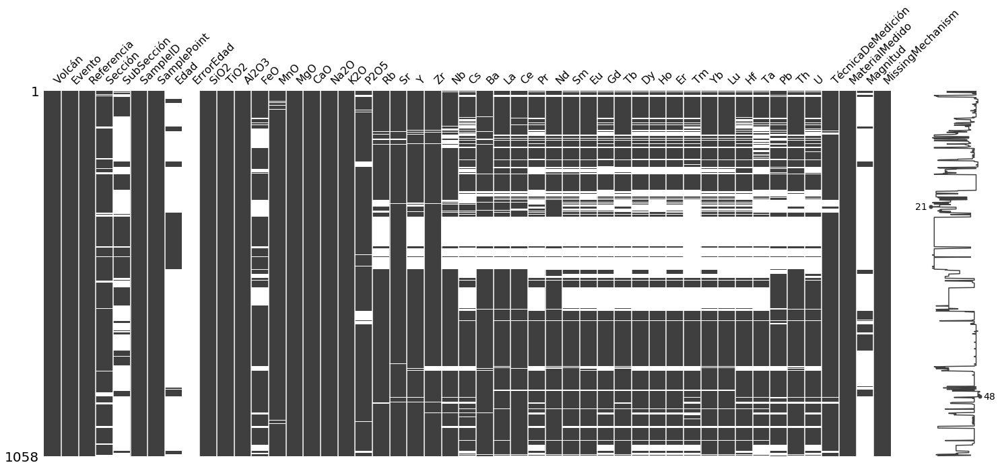

In [5]:
Data = pd.read_excel("../TephraDataBase.xlsx")
Data_MM = Data_MM.drop(['MeasurementRun','87Sr/86Sr','2SE','CódigoLaboratorioRadiocarbono','TipoDeSección','Comentarios','Mapa?','Flag','DescripciónFlag','Latitud','Longitud'], axis=1)
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Ambos'])

# Major elements measurements
Samples were most major elements were measured 

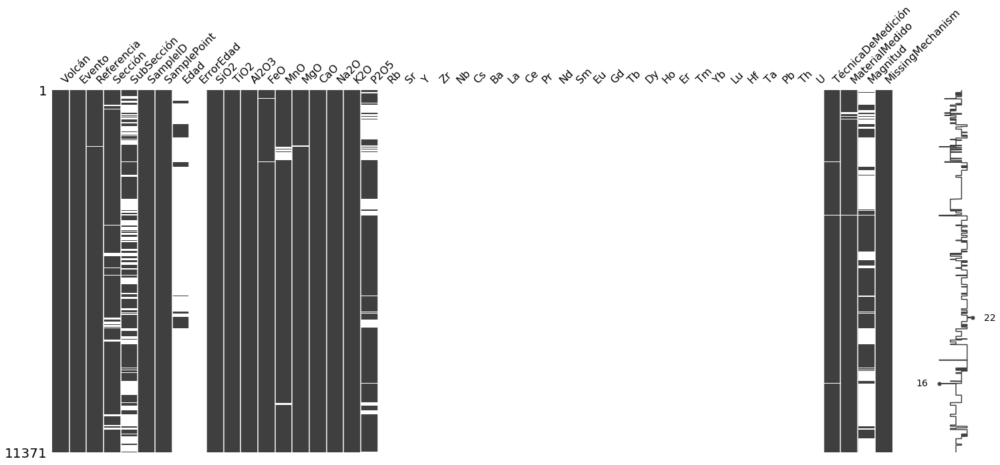

In [6]:
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Mayores'])

# Trace elements measurements
Samples were most trace elements were measured

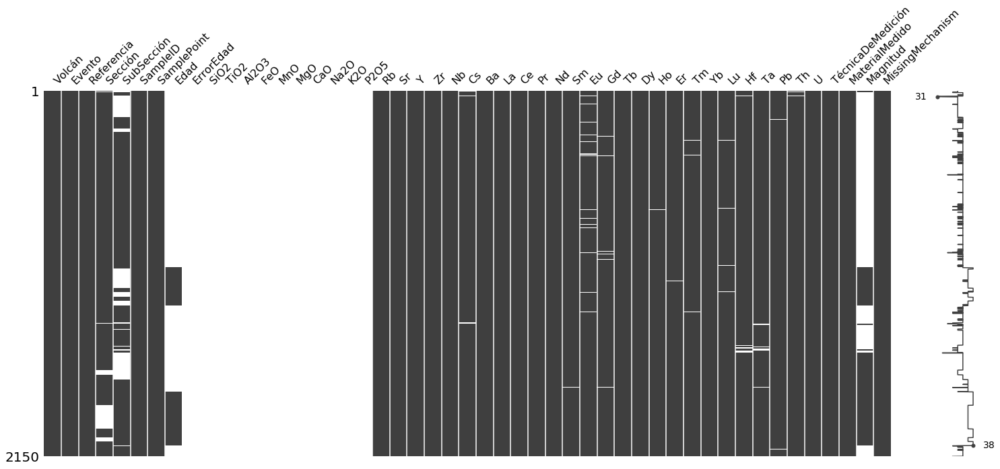

In [7]:
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Traza'])

# Age

This item corresponds to the samples were an age different than "Historic" was stablished based on radiocarbon measurements of organic matter above, below or inside the tephra deposit

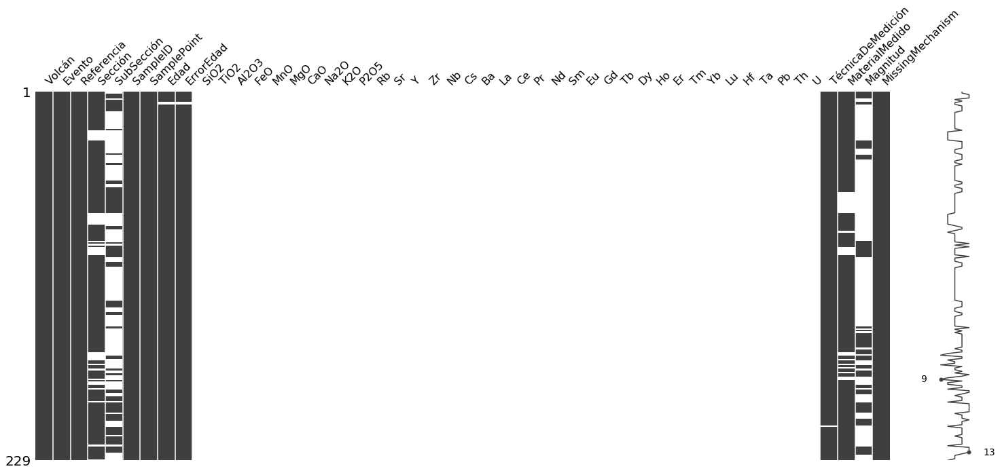

In [8]:
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Edad'])

# Markdown

In [11]:
import pandas_profiling

In [13]:
Data = pd.read_excel("../TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data = Data.drop(['MeasurementRun','87Sr/86Sr','2SE','CódigoLaboratorioRadiocarbono','Comentarios','Mapa?','Flag','DescripciónFlag','Latitud','Longitud'], axis=1)
report = Data.profile_report()

The report seems to be too heavy and is not displayed in the notebook, however if it is saved as above and then opened, it works!

In [14]:
report.to_file('profile_report.html')